In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.width', 500)

#### FUNCTIONS

In [128]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import os
from sklearn.neighbors import LocalOutlierFactor

def load_data_hourly():
    """
    Reads the training dataset from the specified path.

    Returns:
        pd.DataFrame: dataset.
    """
    data = pd.read_csv("data_and_utils\data\hour.csv", index_col=0, parse_dates=['dteday'])
    return data

def load_data_daily():
    """
    Reads the training dataset from the specified path.

    Returns:
        pd.DataFrame: dataset.
    """
    data = pd.read_csv("data_and_utils\data\day.csv", index_col=0, parse_dates=['dteday'])
    return data

def check_df(dataframe):
    """
    Checks the overall structure and key metrics of a DataFrame.

    Args:
        dataframe (pd.DataFrame): DataFrame to inspect.

    Returns:
        None: Prints shape, data types, head, tail, missing values, and quantiles.
    """
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### Head #####################")
    print(dataframe.head(5))
    print("##################### Tail #####################")
    print(dataframe.tail(5))
    print("##################### NA #####################")
    print(dataframe.isnull().sum())
    print('##################### Unique Values #####################')
    print(dataframe.nunique())
    print("##################### Duplicates #####################")
    print(dataframe.duplicated().sum())
    print("##################### Quantiles #####################")
    # Uncomment below to include quantile information
    #print(dataframe[[col for col in dataframe.columns if dataframe[col].dtypes != "O"]].quantile([0, 0.05, 0.50, 0.75, 0.95, 0.99, 1]).T)
    print(dataframe.describe().T)


def grab_col_names(dataframe, cat_th=13, car_th=20):
    """
    Identifies categorical, numerical, and cardinal columns in a DataFrame.

    Args:
        dataframe (pd.DataFrame): The DataFrame to analyze.
        cat_th (int): Threshold for numerical columns to be considered categorical.
        car_th (int): Threshold for categorical columns to be considered cardinal.

    Returns:
        tuple: A tuple containing:
            - cat_cols (list): Categorical columns.
            - num_cols (list): Numerical columns.
            - cat_but_car (list): Cardinal columns.
    """
    # Categorical columns and categorical-like numerical columns
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]

    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # Numerical columns excluding categorical-like ones
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    # Output summary
    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')

    return cat_cols, num_cols, cat_but_car


def target_summary_with_cat(dataframe, target, categorical_col):
    """
    Kategorik bir özellik ile hedef değişken arasındaki ortalama ilişkiyi gösterir.

    Parametreler:
    dataframe : pandas.DataFrame
        Veri seti.
    target : str
        Hedef değişkenin adı.
    categorical_col : str
        Kategorik özelliğin adı.
    """
    print(pd.DataFrame({"TARGET_MEAN": dataframe.groupby(categorical_col)[target].mean()}), end="\n\n\n")


def target_summary_with_num(dataframe, target, numerical_col):
    """
    Sayısal bir özellik ile hedef değişken arasındaki ortalama ilişkiyi gösterir.

    Parametreler:
    dataframe : pandas.DataFrame
        Veri seti.
    target : str
        Hedef değişkenin adı.
    numerical_col : str
        Sayısal özelliğin adı.
    """
    print(dataframe.groupby(target).agg({numerical_col: ['mean', 'median', 'std', 'min', 'max']}), end="\n\n\n")


def high_correlated_cols(dataframe, plot=False, corr_th=0.70):
    """
    Identifies highly correlated columns.

    Args:
        dataframe (pd.DataFrame): DataFrame to analyze.
        plot (bool): Whether to display a correlation heatmap.
        corr_th (float): Correlation threshold for identifying columns.

    Returns:
        list: List of columns with high correlation.
    """
    corr = dataframe.corr()
    cor_matrix = corr.abs()
    upper_triangle_matrix = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))
    drop_list = [col for col in upper_triangle_matrix.columns if any(upper_triangle_matrix[col] > corr_th)]
    if plot:
        sns.set(rc={'figure.figsize': (15, 15)})
        sns.heatmap(corr, cmap="vlag")
        plt.show()
    return drop_list


def correlation_matrix(df, cols):
    """
    Visualizes the correlation matrix for specified columns.

    Args:
        df (pd.DataFrame): DataFrame to analyze.
        cols (list): List of columns to include in the correlation matrix.

    Returns:
        None: Displays a heatmap.
    """
    fig = plt.gcf()
    fig.set_size_inches(20, 16)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    fig = sns.heatmap(df[cols].corr(), annot=True, linewidths=0.5,
                      annot_kws={'size': 12}, linecolor='w', cmap='vlag')
    plt.show(block=True)


def outlier_thresholds(dataframe, col_name, q1=0.25, q3=0.75):
    """
    Calculates the lower and upper thresholds for outlier detection based on the interquartile range (IQR).

    Args:
        dataframe (pd.DataFrame): The DataFrame to analyze.
        col_name (str): Column name for which to calculate thresholds.
        q1 (float): Lower quantile (default is 0.25).
        q3 (float): Upper quantile (default is 0.75).

    Returns:
        tuple: A tuple containing the lower and upper thresholds.
    """
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit


def check_outlier(dataframe, col_name):
    """
    Checks if a column contains outliers based on calculated thresholds.

    Args:
        dataframe (pd.DataFrame): The DataFrame to analyze.
        col_name (str): Column name to check.

    Returns:
        bool: True if outliers exist, False otherwise.
    """
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    return dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None)


def grab_outliers(dataframe, col_name, index=False):
    """
    Retrieves and optionally returns the indices of outliers in a specified column.

    Args:
        dataframe (pd.DataFrame): The DataFrame to analyze.
        col_name (str): Column name to retrieve outliers from.
        index (bool): If True, returns the indices of the outliers.

    Returns:
        pd.Index (optional): Indices of outliers if index=True.
    """
    low, up = outlier_thresholds(dataframe, col_name)


    if dataframe[((dataframe[col_name] < low) | (dataframe[col_name] > up))].shape[0] > 10:
        print(dataframe[((dataframe[col_name] < low) | (dataframe[col_name] > up))].head())
    else:
        print(dataframe[((dataframe[col_name] < low) | (dataframe[col_name] > up))])


    if index:
        outlier_index = dataframe[((dataframe[col_name] < low) | (dataframe[col_name] > up))].index
        return outlier_index


def remove_outlier(dataframe, col_name):
    """
    Removes outliers from a specified column.

    Args:
        dataframe (pd.DataFrame): The DataFrame to analyze.
        col_name (str): Column name to remove outliers from.

    Returns:
        pd.DataFrame: DataFrame with outliers removed.
    """
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    df_without_outliers = dataframe[~((dataframe[col_name] < low_limit) | (dataframe[col_name] > up_limit))]
    return df_without_outliers


def replace_with_thresholds(dataframe, variable):
    """
    Replaces outliers in a specified column with the lower and upper thresholds.

    Args:
        dataframe (pd.DataFrame): The DataFrame to modify.
        variable (str): Column name to replace outliers in.
    """
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit






#### Dataset characteristics
	
Both hour.csv and day.csv have the following fields, except hr which is not available in day.csv
	
	- instant: record index
	- dteday : date
	- season : season (1:springer, 2:summer, 3:fall, 4:winter)
	- yr : year (0: 2011, 1:2012)
	- mnth : month ( 1 to 12)
	- hr : hour (0 to 23)
	- holiday : weather day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
	- weekday : day of the week
	- workingday : if day is neither weekend nor holiday is 1, otherwise is 0.
	+ weathersit : 
		- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
		- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
		- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
		- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
	- temp : Normalized temperature in Celsius. The values are divided to 41 (max)
	- atemp: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
	- hum: Normalized humidity. The values are divided to 100 (max)
	- windspeed: Normalized wind speed. The values are divided to 67 (max)
	- casual: count of casual users
	- registered: count of registered users
	- cnt: count of total rental bikes including both casual and registered

In [3]:
df_daily = load_data_daily()
df_hourly = load_data_hourly()

# EDA

In [4]:
check_df(df_daily)

##################### Shape #####################
(731, 15)
##################### Types #####################
dteday        datetime64[ns]
season                 int64
yr                     int64
mnth                   int64
holiday                int64
weekday                int64
workingday             int64
weathersit             int64
temp                 float64
atemp                float64
hum                  float64
windspeed            float64
casual                 int64
registered             int64
cnt                    int64
dtype: object
##################### Head #####################
            dteday  season  yr  mnth  holiday  weekday  workingday  weathersit  temp  atemp   hum  windspeed  casual  registered   cnt
instant                                                                                                                               
1       2011-01-01       1   0     1        0        6           0           2 0.344  0.364 0.806      0.160     331      

In [5]:
check_df(df_hourly)

##################### Shape #####################
(17379, 16)
##################### Types #####################
dteday        datetime64[ns]
season                 int64
yr                     int64
mnth                   int64
hr                     int64
holiday                int64
weekday                int64
workingday             int64
weathersit             int64
temp                 float64
atemp                float64
hum                  float64
windspeed            float64
casual                 int64
registered             int64
cnt                    int64
dtype: object
##################### Head #####################
            dteday  season  yr  mnth  hr  holiday  weekday  workingday  weathersit  temp  atemp   hum  windspeed  casual  registered  cnt
instant                                                                                                                                  
1       2011-01-01       1   0     1   0        0        6           0           1 0.

## Visualizations

    - In order to be able to visualize the columns we first need to capture cat and num feature names.
    - Utilizing grab_col_names() function with certain parameters will yield us the column names accordingly. These parameters are chosen based on considerations over unique values of the features.

In [6]:
cat_cols, num_cols, cat_but_car = grab_col_names(df_hourly, cat_th=25, car_th=20)

Observations: 17379
Variables: 16
cat_cols: 8
num_cols: 8
cat_but_car: 0
num_but_cat: 8


In [8]:
print(num_cols)
print(cat_cols)
print(cat_but_car)

['dteday', 'temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt']
['season', 'yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday', 'weathersit']
[]


### Feature Visualizations

#### Categorical Features

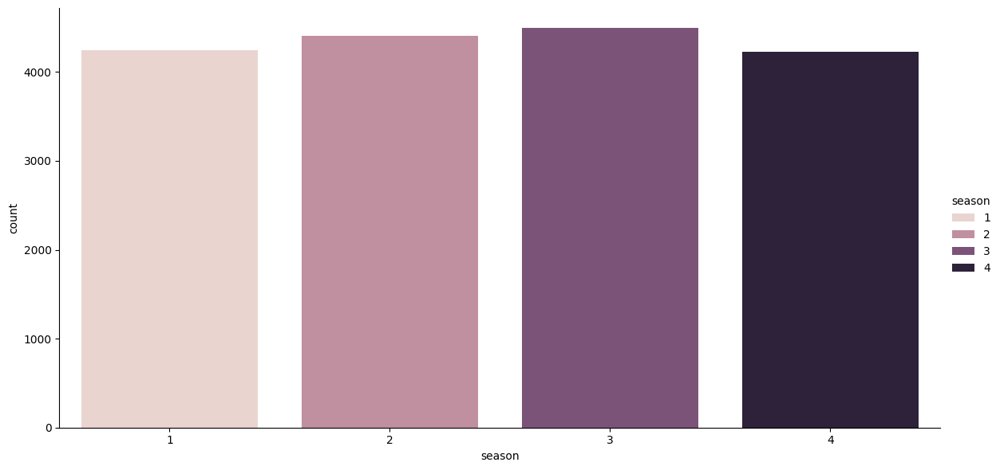

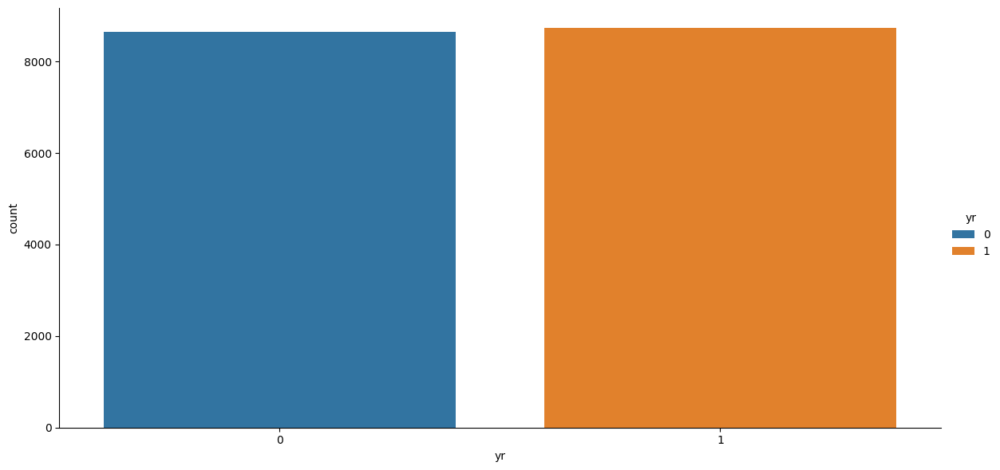

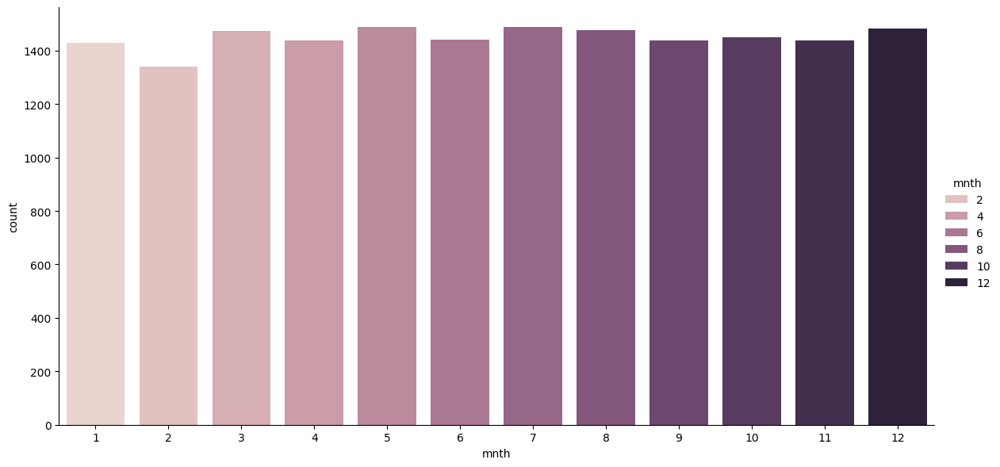

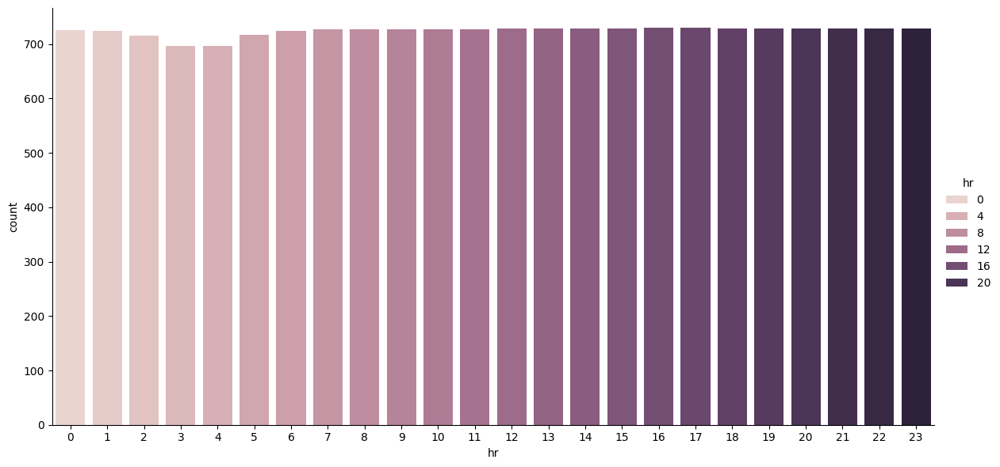

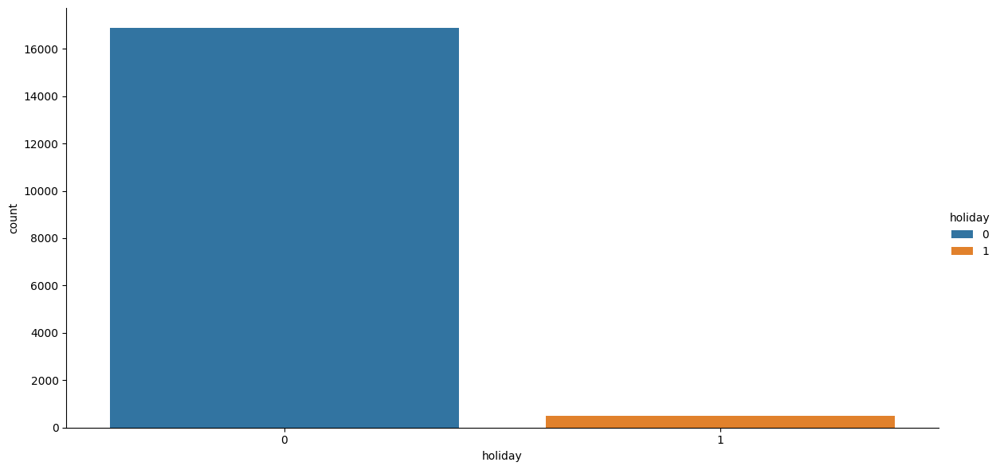

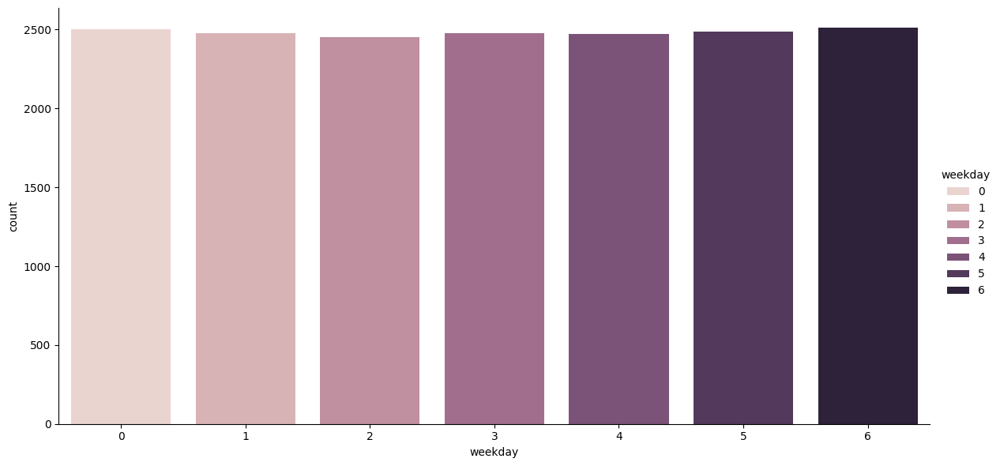

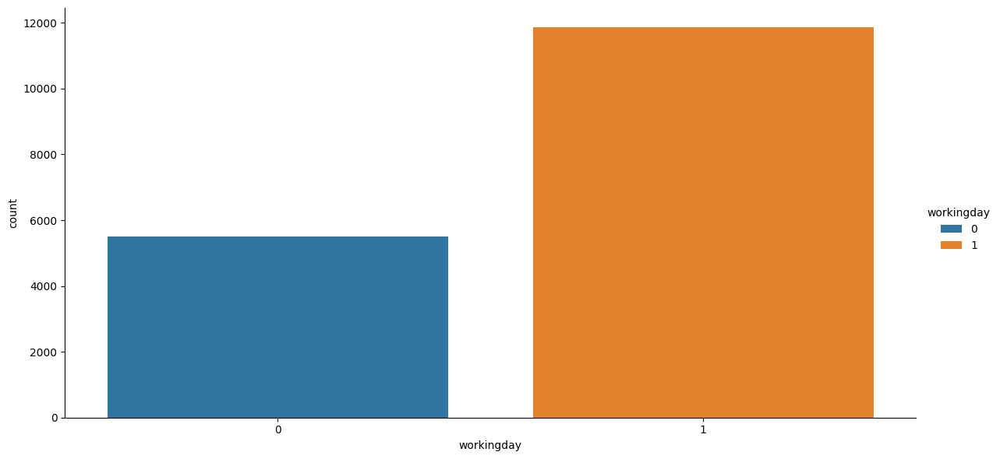

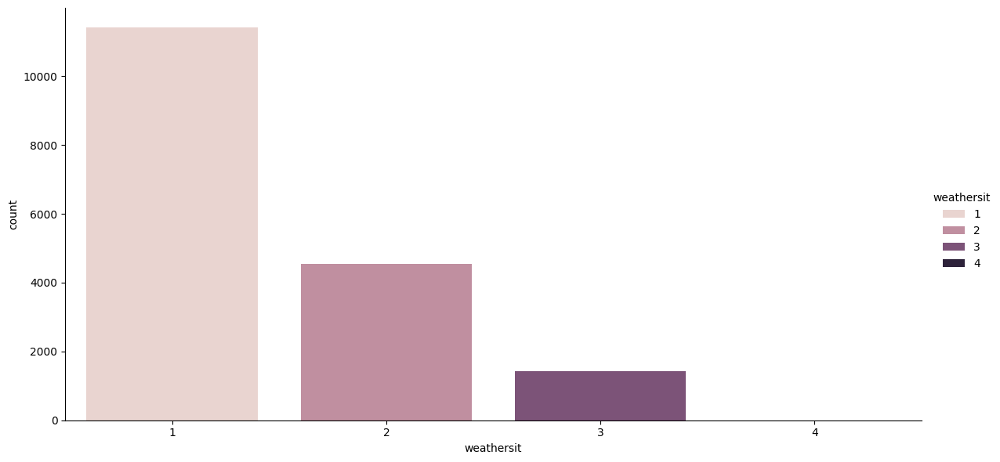

In [7]:
for col in cat_cols:
    ax = sns.catplot(kind='count', data=df_hourly, x=col, hue=col, height=6, aspect=2)

**OBSERVATIONS**
- Time based features are uniformly distributed as expected.
- Class imbalance is observed in weathersit, workingday and holiday features. 

#### Numerical Features

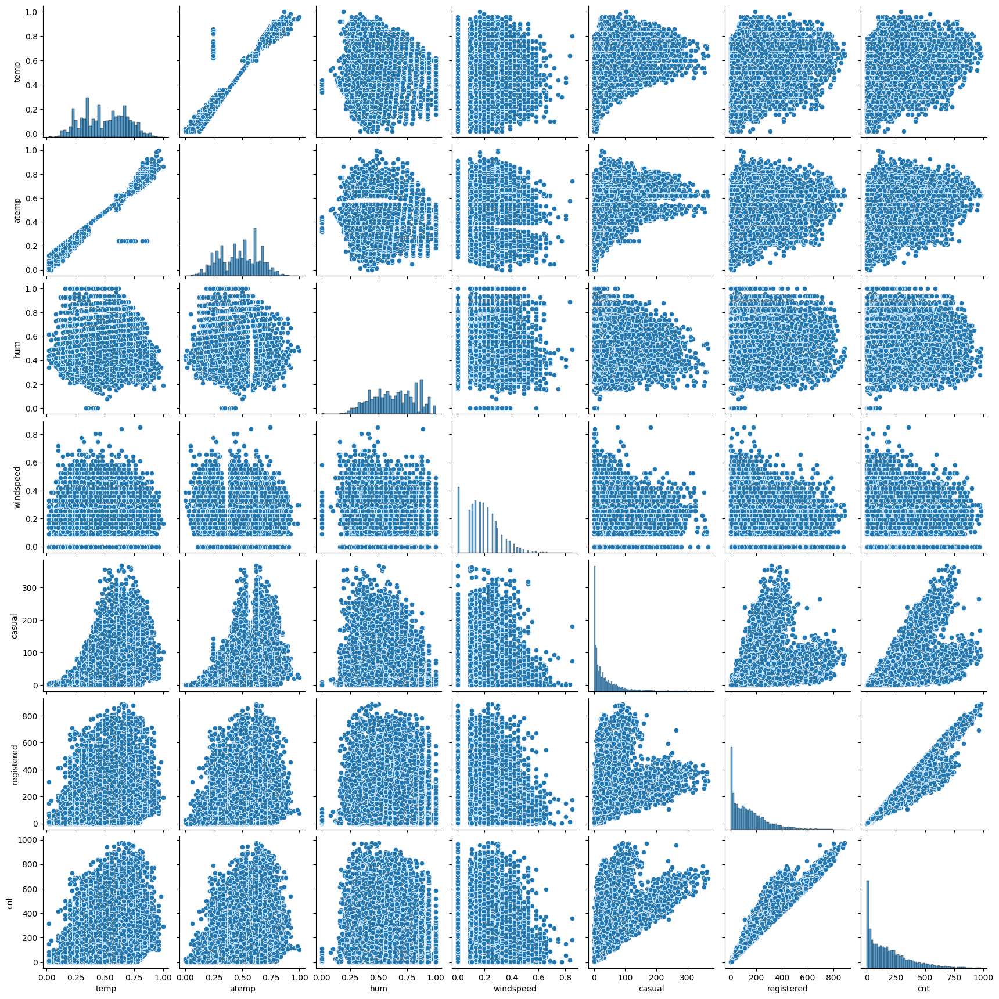

In [9]:
sns.pairplot(df_hourly[num_cols])

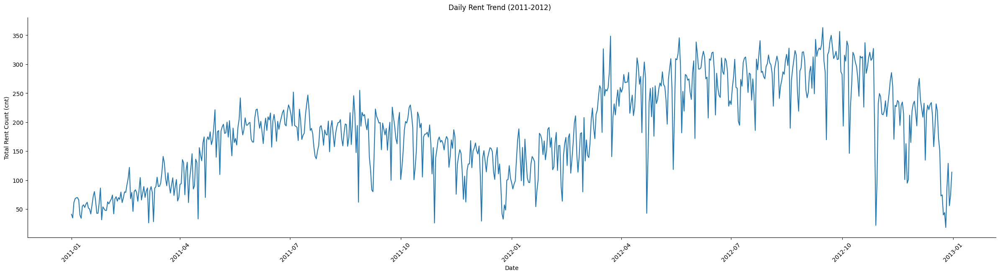

In [10]:
g = sns.relplot(
    data=df_hourly, 
    x="dteday", 
    y="cnt", 
    kind="line", 
    height=6, 
    aspect=4,
    errorbar=None
)

g.figure.suptitle("Daily Rent Trend (2011-2012)", y=1.03)
g.set_axis_labels("Date", "Total Rent Count (cnt)")

plt.xticks(rotation=45)

plt.show()

**OBSERVATIONS**
- non-stagnant
- Seasonal
- Trendy
- Rent count increases during  through the end of spring and summer, peeks at fall

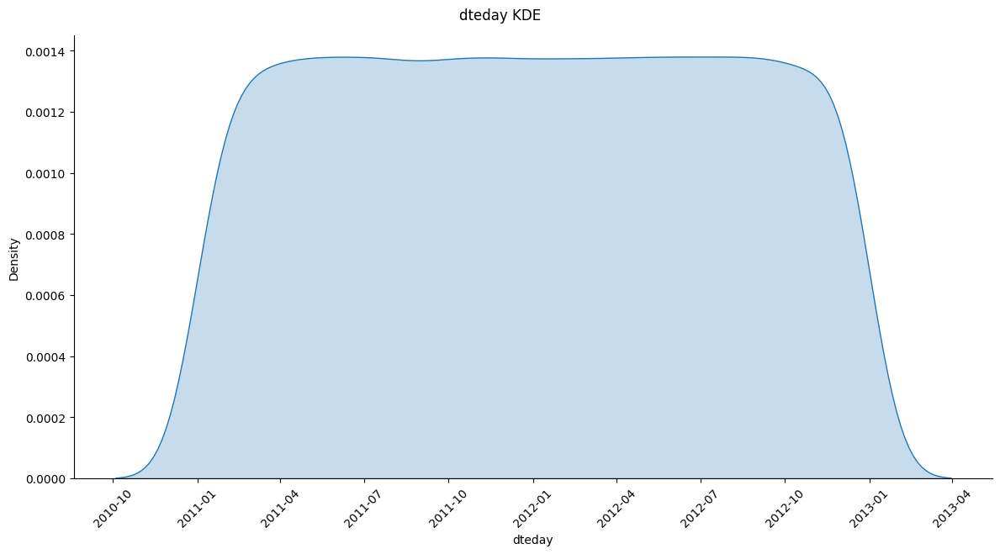

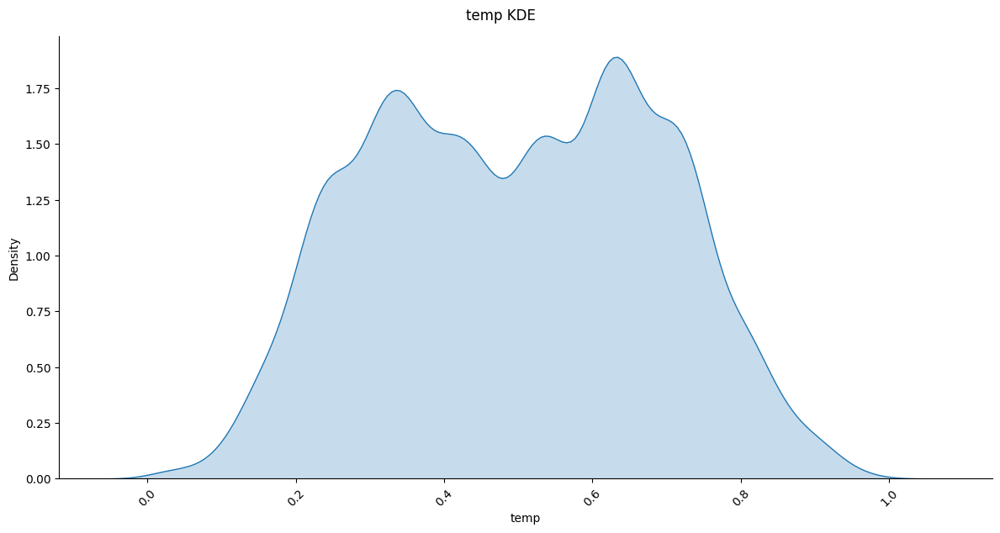

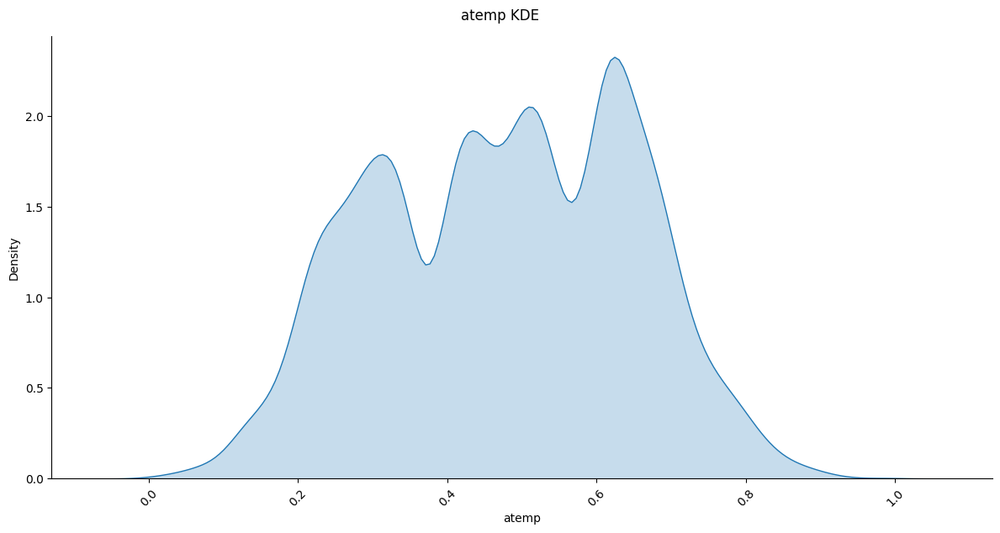

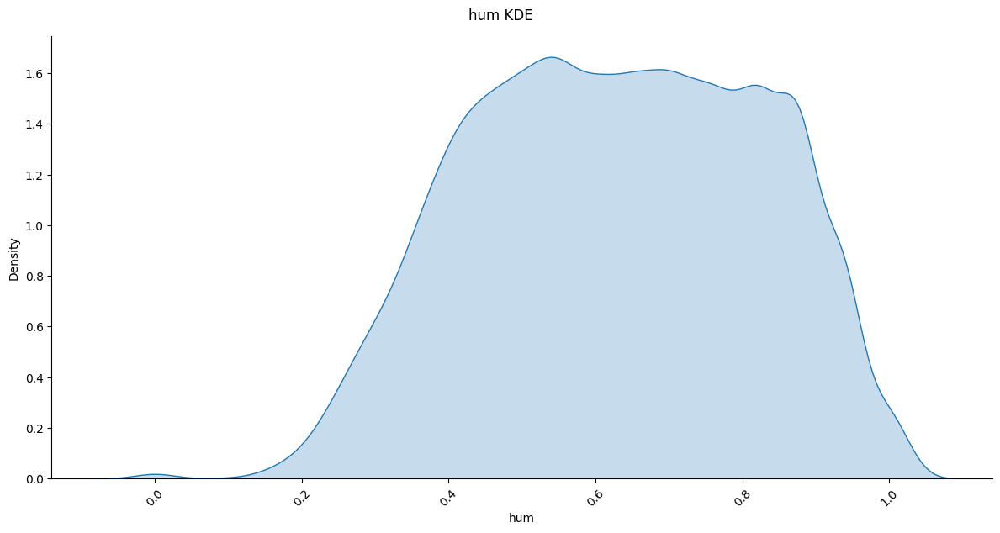

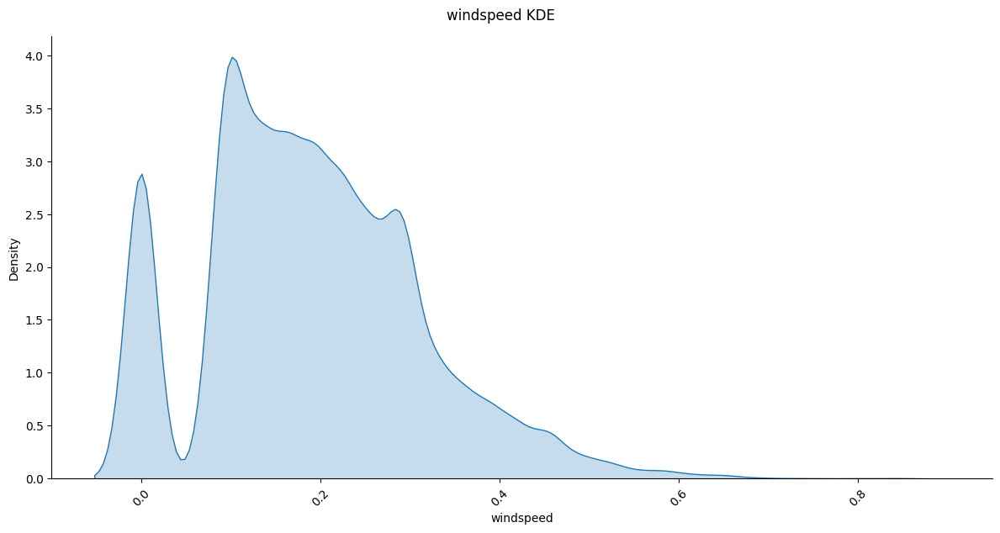

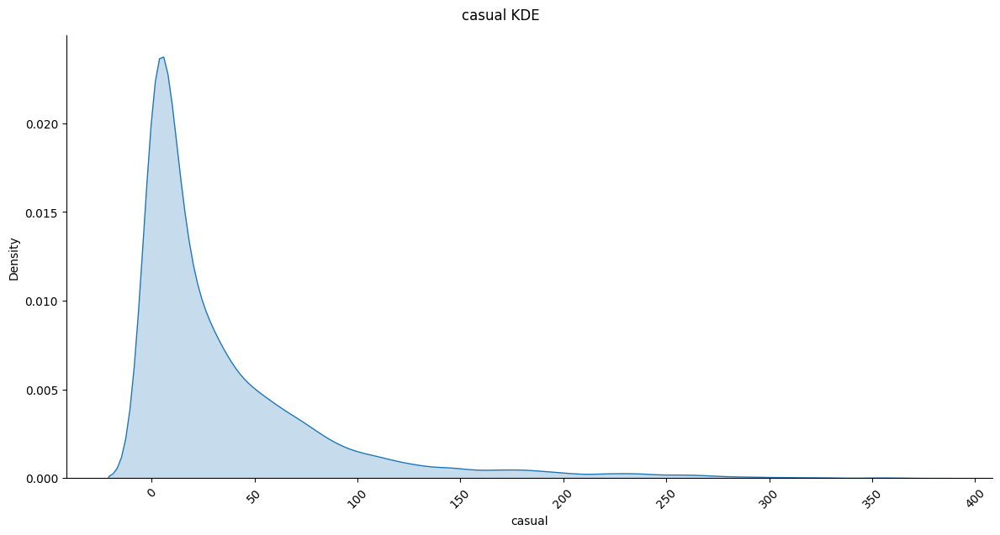

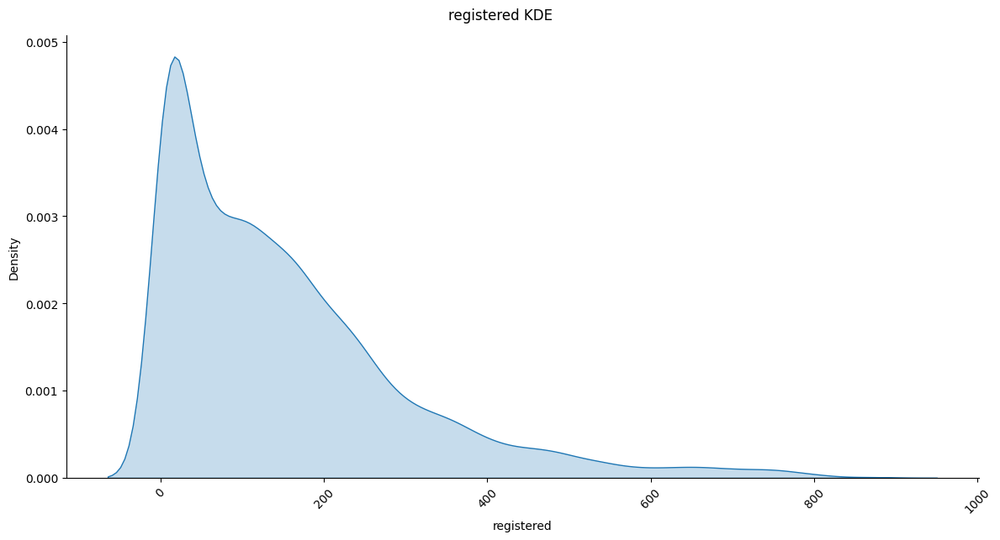

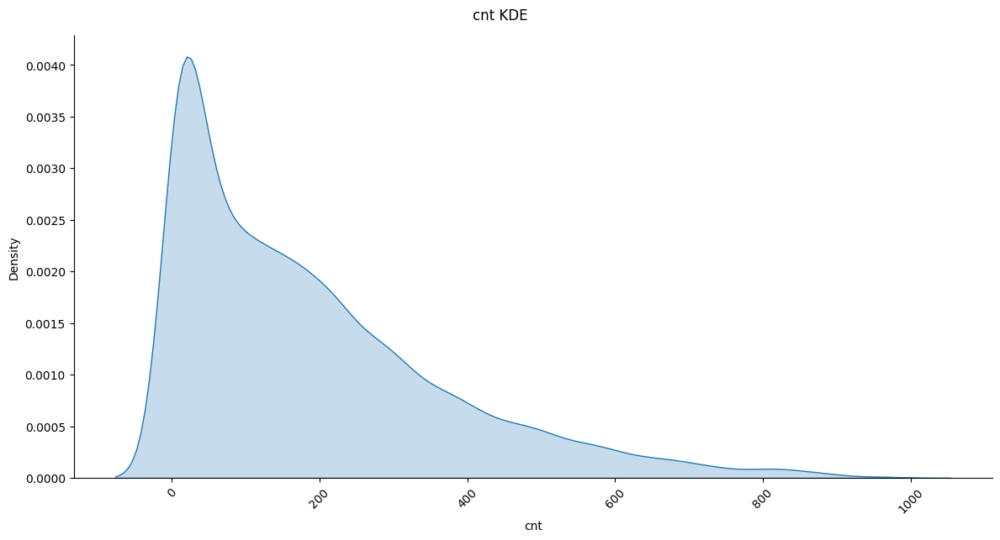

In [11]:
for col in num_cols:
    g = sns.displot(kind='kde', data=df_hourly, x=col, fill=True, height=6, aspect=2)
    g.figure.suptitle(col + " " + "KDE", y=1.03)
    plt.xticks(rotation=45)
    plt.show()

#### Target Guided Feature Visualizations

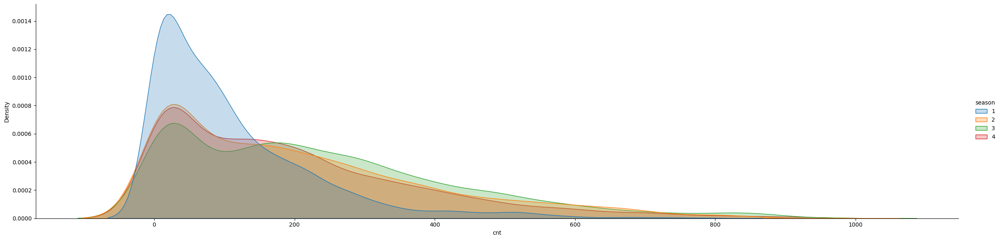

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




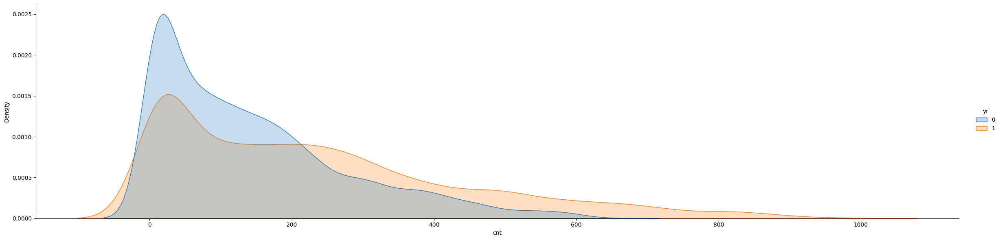

    TARGET_MEAN
yr             
0       143.794
1       234.666




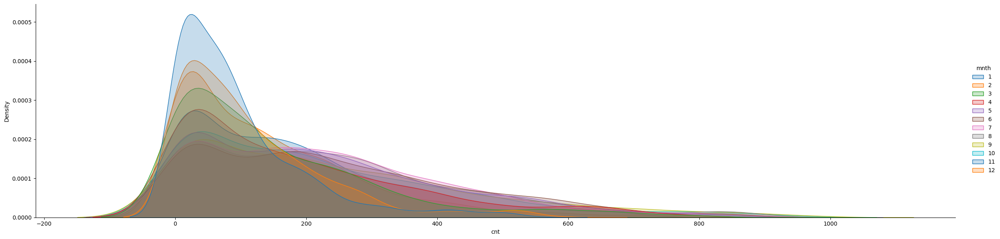

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




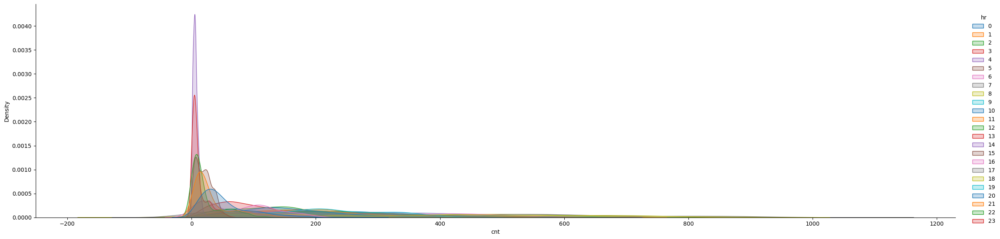

    TARGET_MEAN
hr             
0        53.898
1        33.376
2        22.870
3        11.727
4         6.353
5        19.890
6        76.044
7       212.065
8       359.011
9       219.309
10      173.669
11      208.143
12      253.316
13      253.661
14      240.949
15      251.233
16      311.984
17      461.452
18      425.511
19      311.523
20      226.030
21      172.315
22      131.335
23       87.831




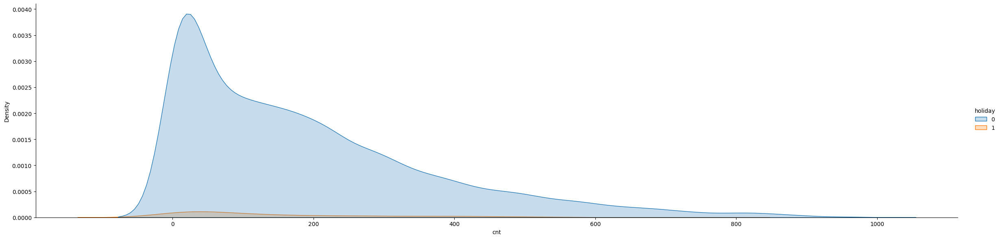

         TARGET_MEAN
holiday             
0            190.429
1            156.870




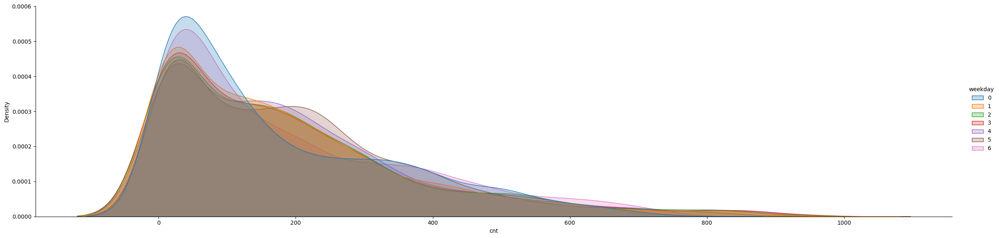

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




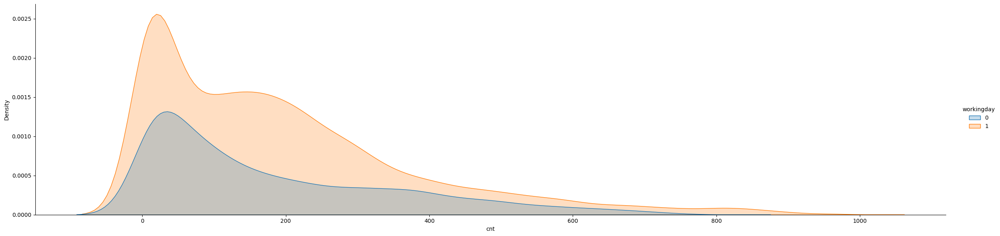

            TARGET_MEAN
workingday             
0               181.405
1               193.208




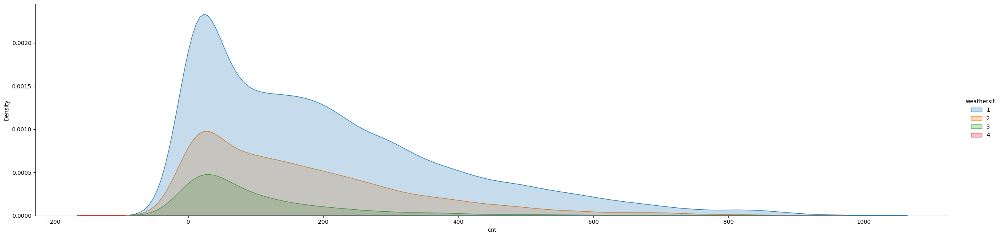

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




In [12]:
for col in cat_cols:
    sns.displot(kind='kde', data=df_hourly, x='cnt', hue=col, fill=True, palette='tab10', height=6, aspect=4)
    plt.show()
    #sns.kdeplot(data=df_hourly, x='cnt', hue=col)
    target_summary_with_cat(df_hourly, 'cnt', col)

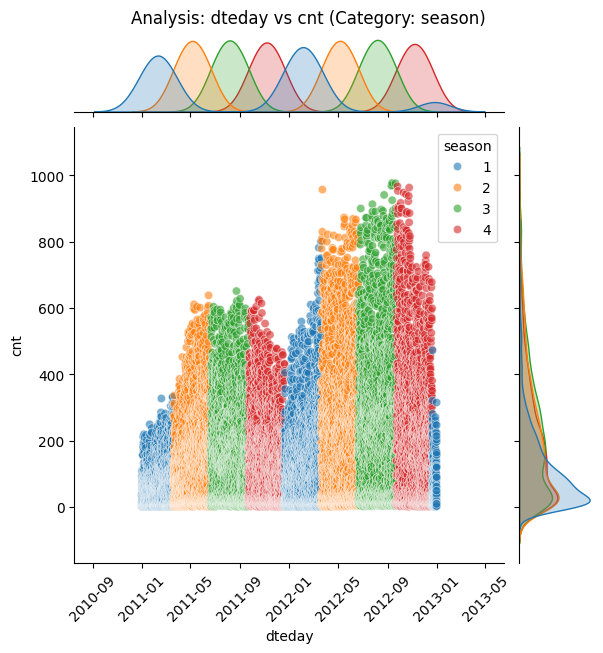

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




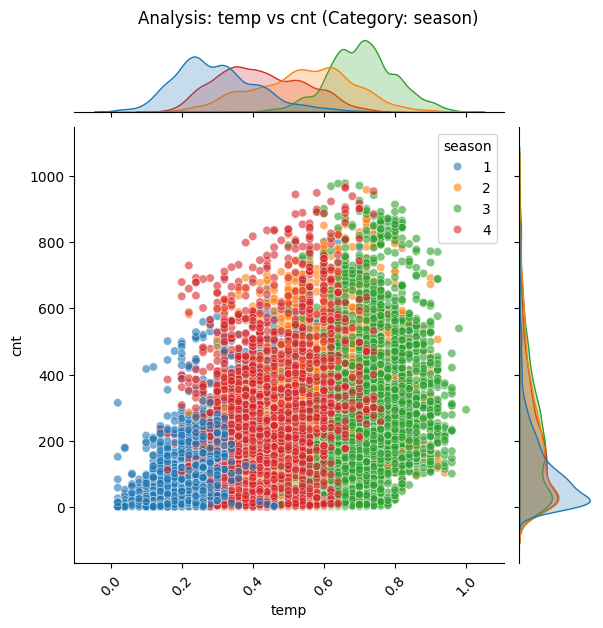

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




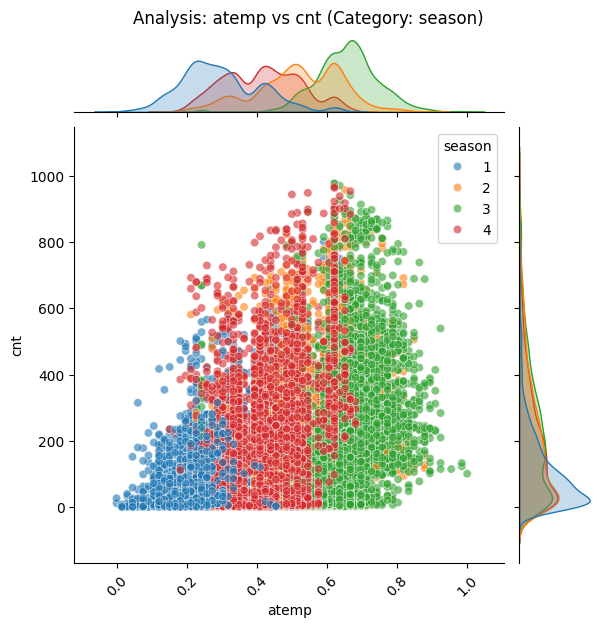

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




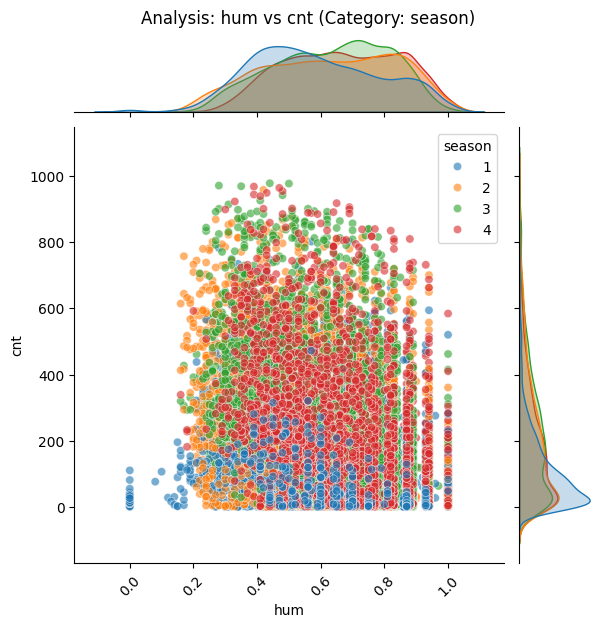

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




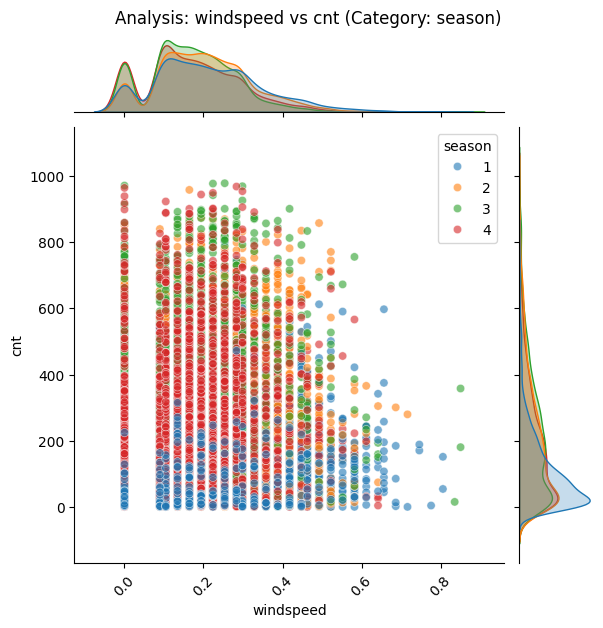

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




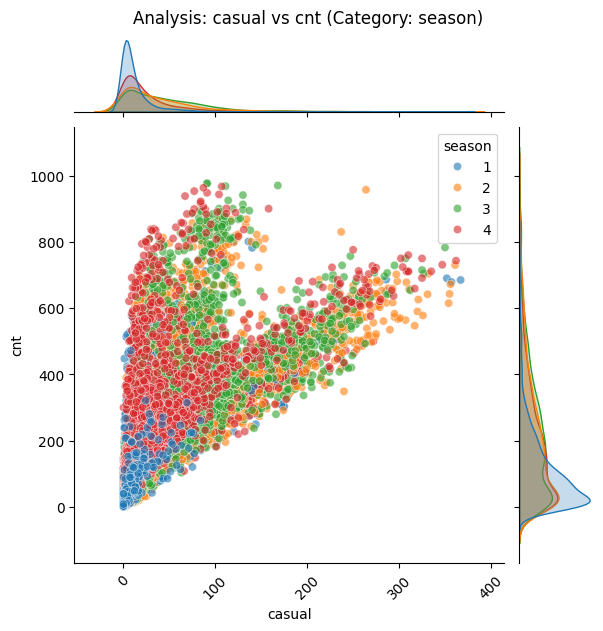

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




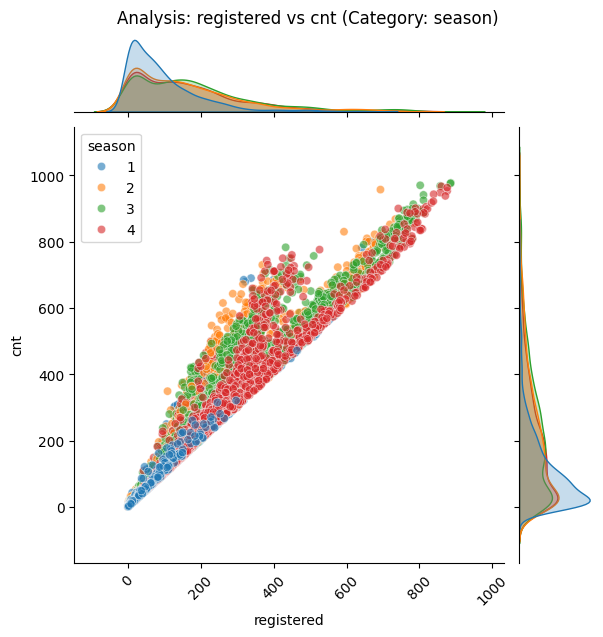

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




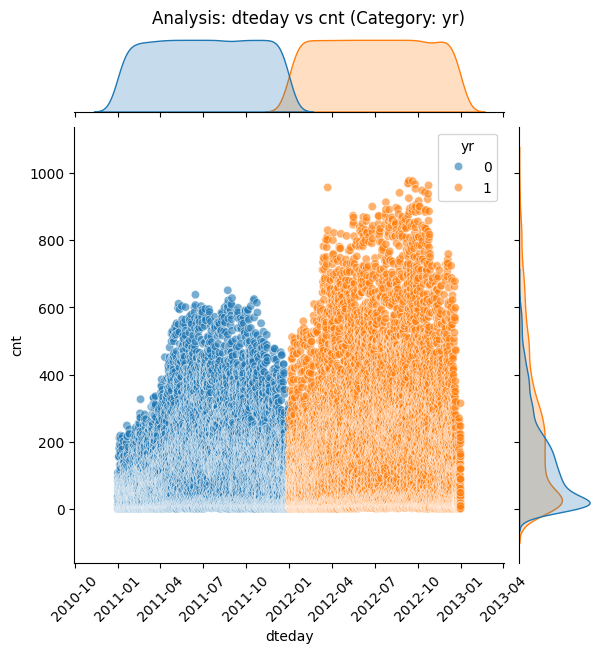

    TARGET_MEAN
yr             
0       143.794
1       234.666




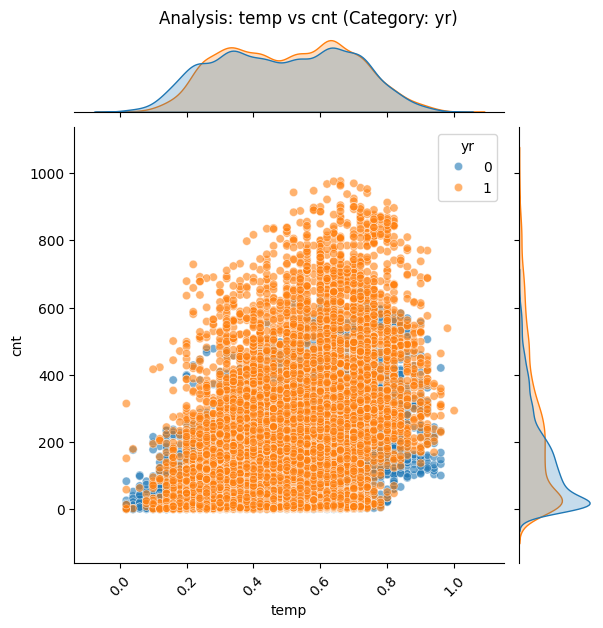

    TARGET_MEAN
yr             
0       143.794
1       234.666




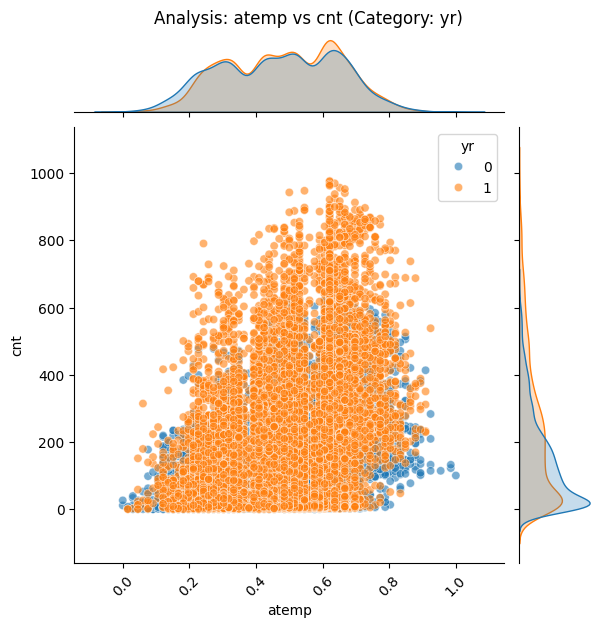

    TARGET_MEAN
yr             
0       143.794
1       234.666




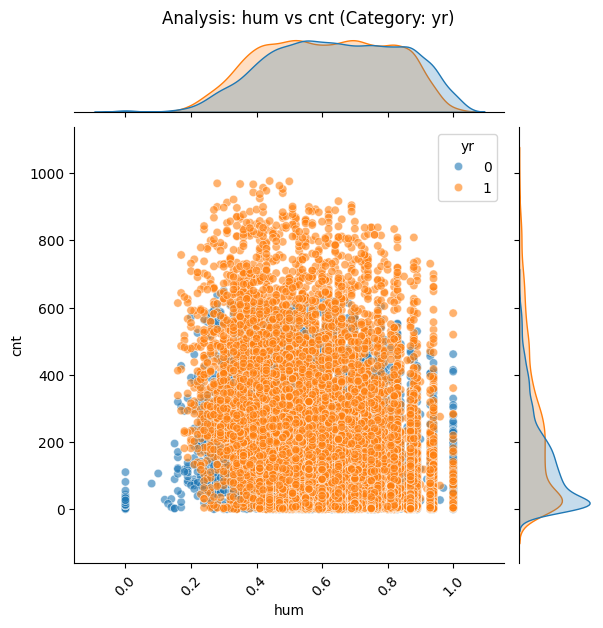

    TARGET_MEAN
yr             
0       143.794
1       234.666




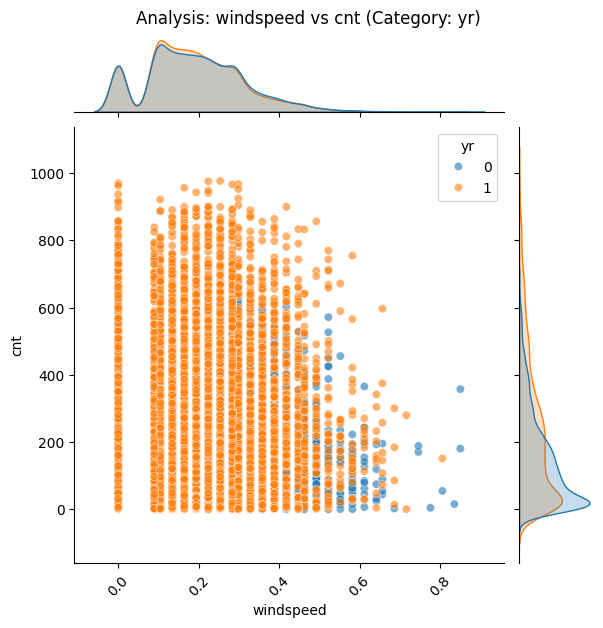

    TARGET_MEAN
yr             
0       143.794
1       234.666




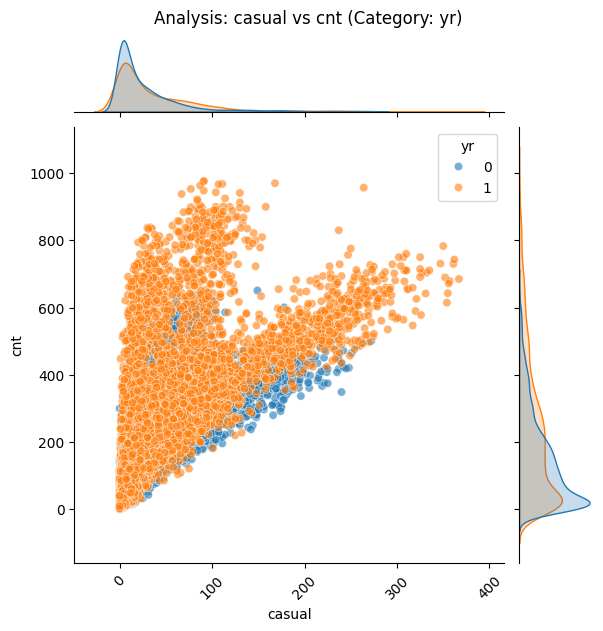

    TARGET_MEAN
yr             
0       143.794
1       234.666




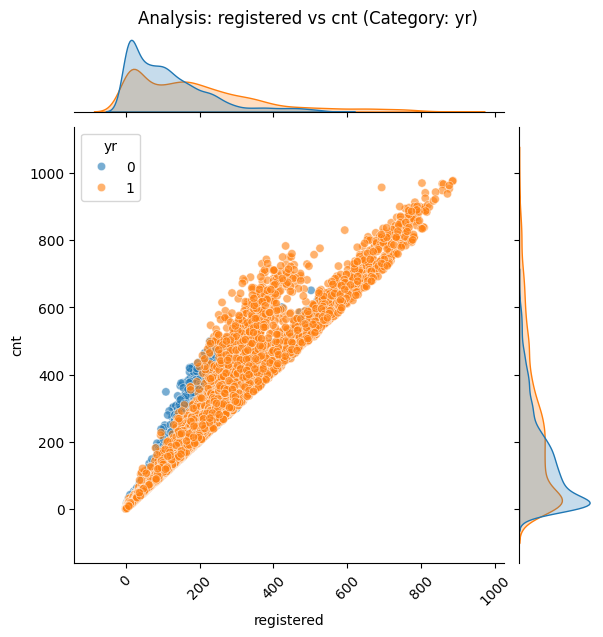

    TARGET_MEAN
yr             
0       143.794
1       234.666




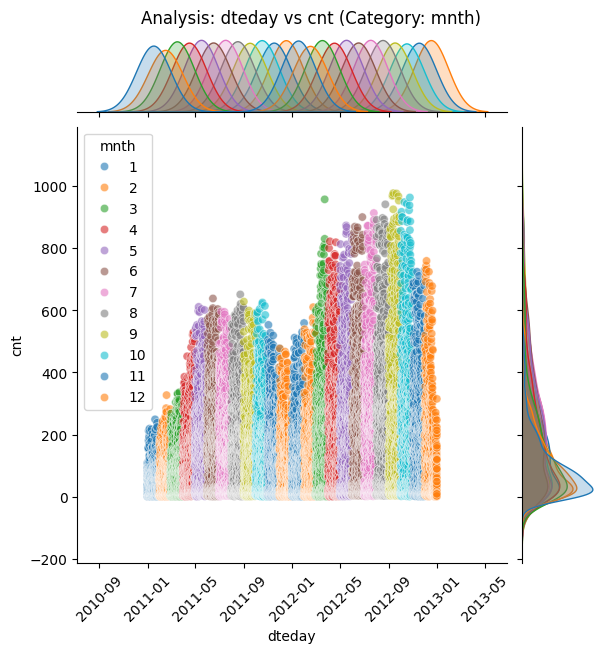

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




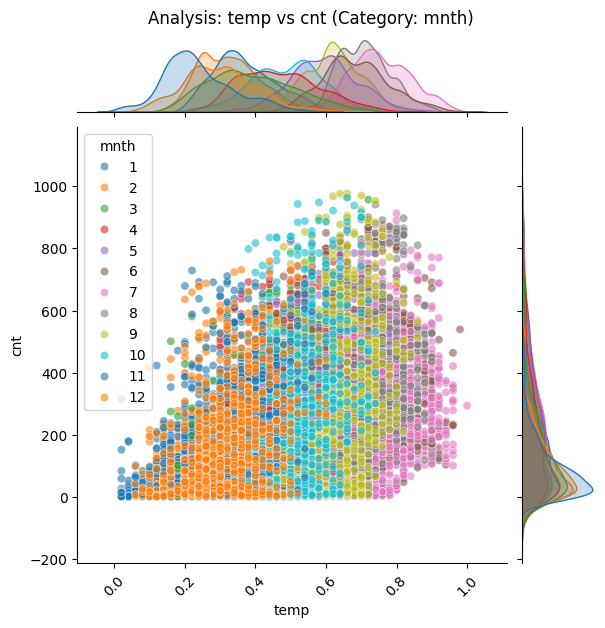

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




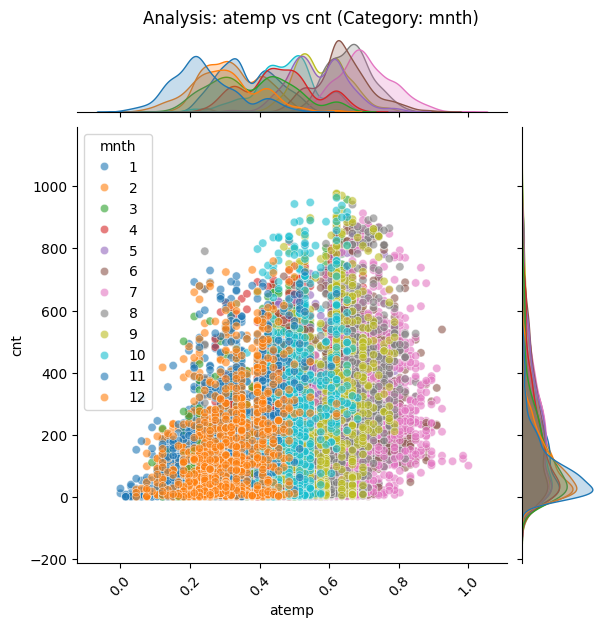

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




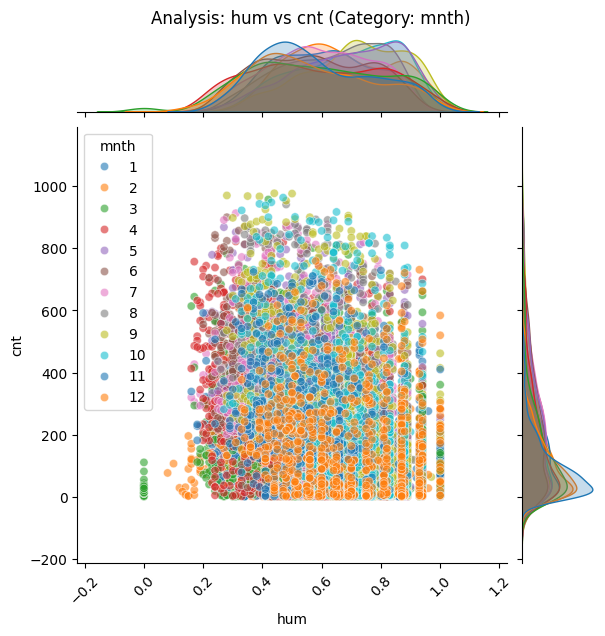

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




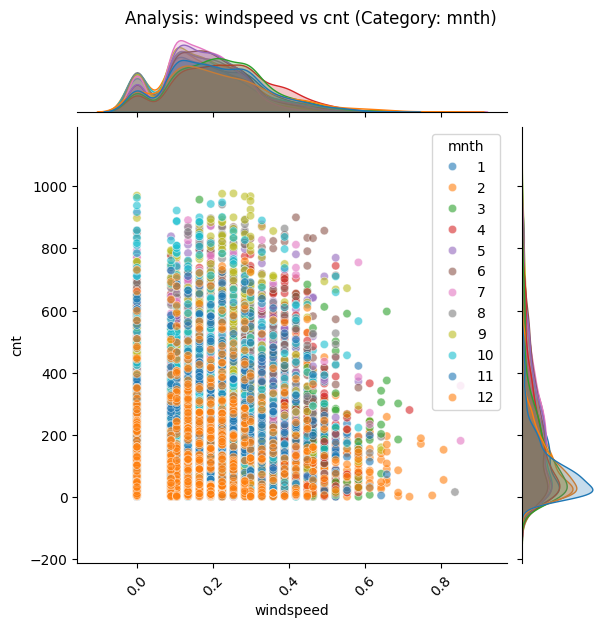

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




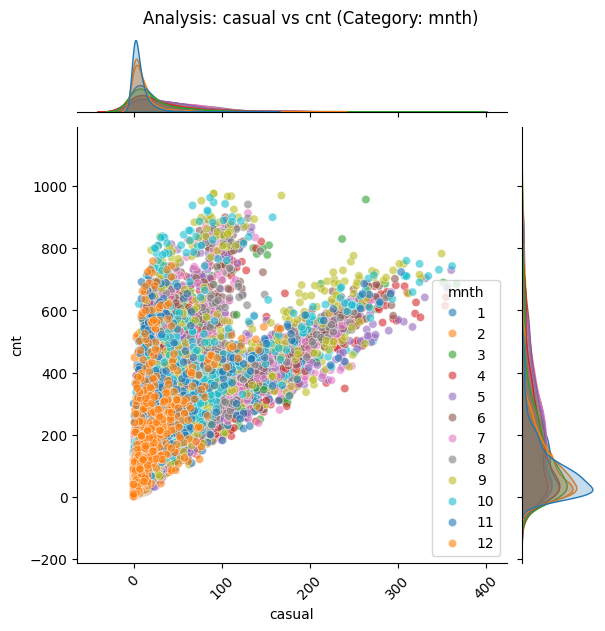

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




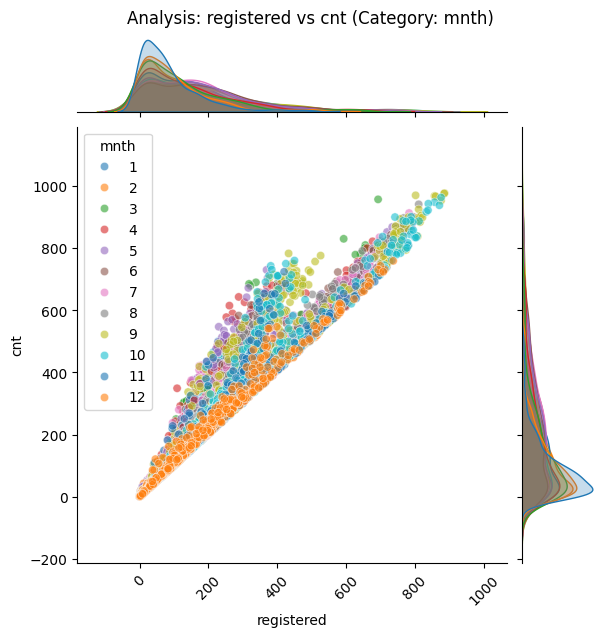

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




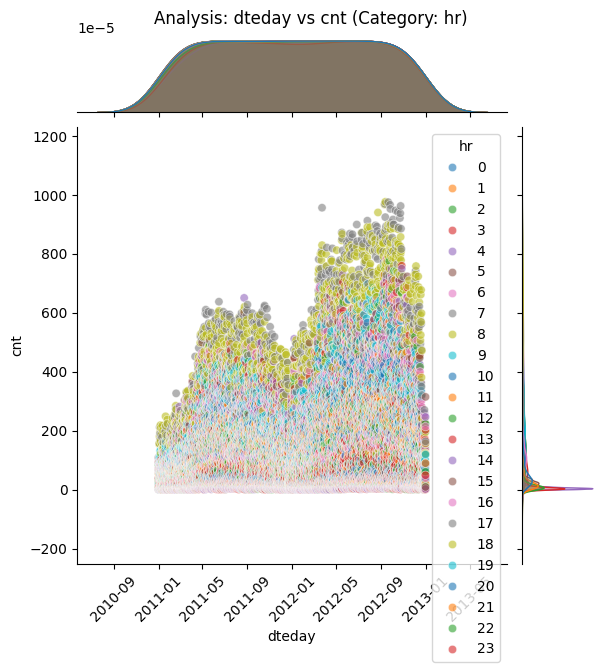

    TARGET_MEAN
hr             
0        53.898
1        33.376
2        22.870
3        11.727
4         6.353
5        19.890
6        76.044
7       212.065
8       359.011
9       219.309
10      173.669
11      208.143
12      253.316
13      253.661
14      240.949
15      251.233
16      311.984
17      461.452
18      425.511
19      311.523
20      226.030
21      172.315
22      131.335
23       87.831




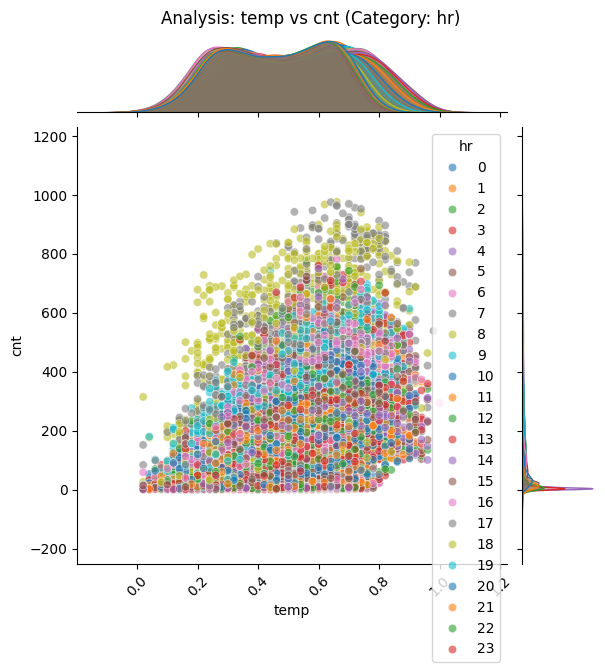

    TARGET_MEAN
hr             
0        53.898
1        33.376
2        22.870
3        11.727
4         6.353
5        19.890
6        76.044
7       212.065
8       359.011
9       219.309
10      173.669
11      208.143
12      253.316
13      253.661
14      240.949
15      251.233
16      311.984
17      461.452
18      425.511
19      311.523
20      226.030
21      172.315
22      131.335
23       87.831




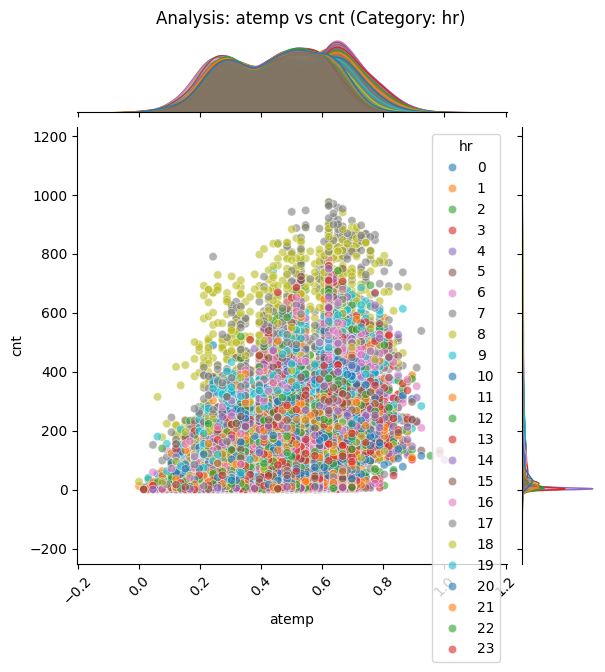

    TARGET_MEAN
hr             
0        53.898
1        33.376
2        22.870
3        11.727
4         6.353
5        19.890
6        76.044
7       212.065
8       359.011
9       219.309
10      173.669
11      208.143
12      253.316
13      253.661
14      240.949
15      251.233
16      311.984
17      461.452
18      425.511
19      311.523
20      226.030
21      172.315
22      131.335
23       87.831




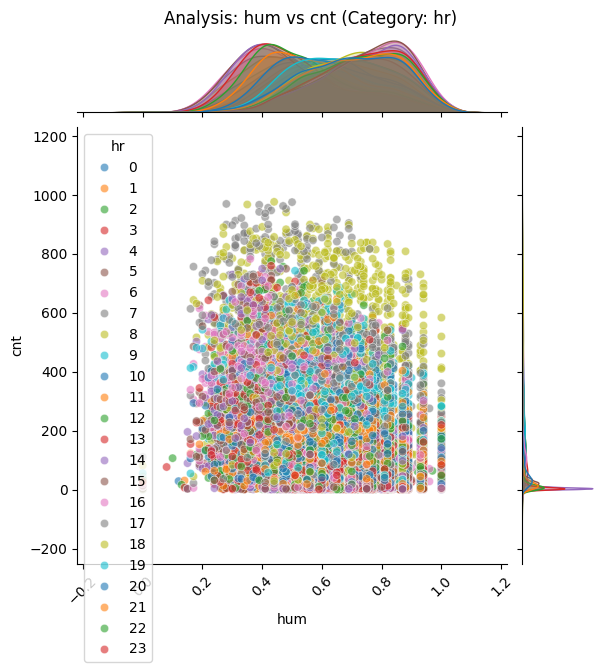

    TARGET_MEAN
hr             
0        53.898
1        33.376
2        22.870
3        11.727
4         6.353
5        19.890
6        76.044
7       212.065
8       359.011
9       219.309
10      173.669
11      208.143
12      253.316
13      253.661
14      240.949
15      251.233
16      311.984
17      461.452
18      425.511
19      311.523
20      226.030
21      172.315
22      131.335
23       87.831




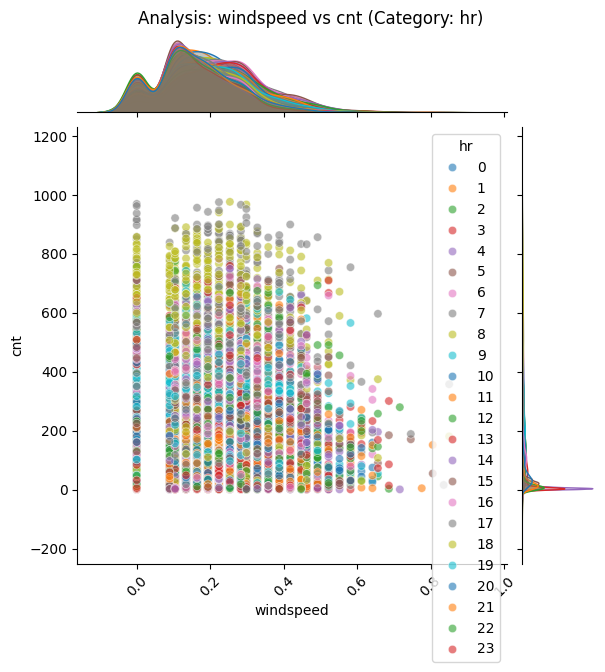

    TARGET_MEAN
hr             
0        53.898
1        33.376
2        22.870
3        11.727
4         6.353
5        19.890
6        76.044
7       212.065
8       359.011
9       219.309
10      173.669
11      208.143
12      253.316
13      253.661
14      240.949
15      251.233
16      311.984
17      461.452
18      425.511
19      311.523
20      226.030
21      172.315
22      131.335
23       87.831




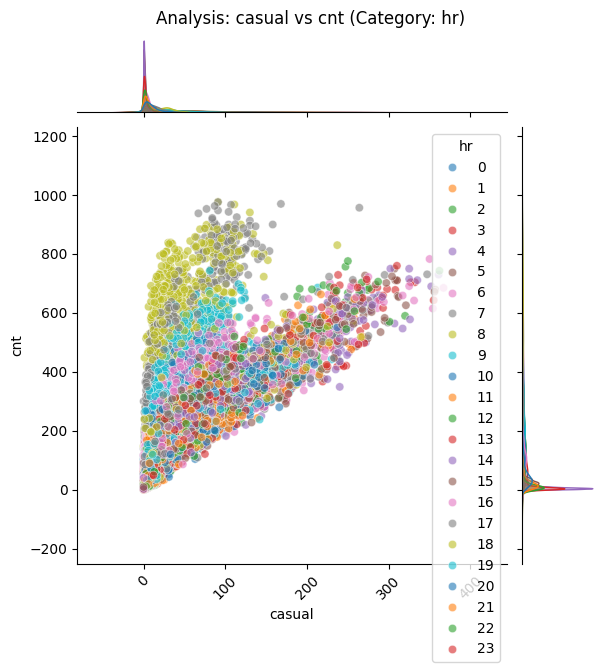

    TARGET_MEAN
hr             
0        53.898
1        33.376
2        22.870
3        11.727
4         6.353
5        19.890
6        76.044
7       212.065
8       359.011
9       219.309
10      173.669
11      208.143
12      253.316
13      253.661
14      240.949
15      251.233
16      311.984
17      461.452
18      425.511
19      311.523
20      226.030
21      172.315
22      131.335
23       87.831




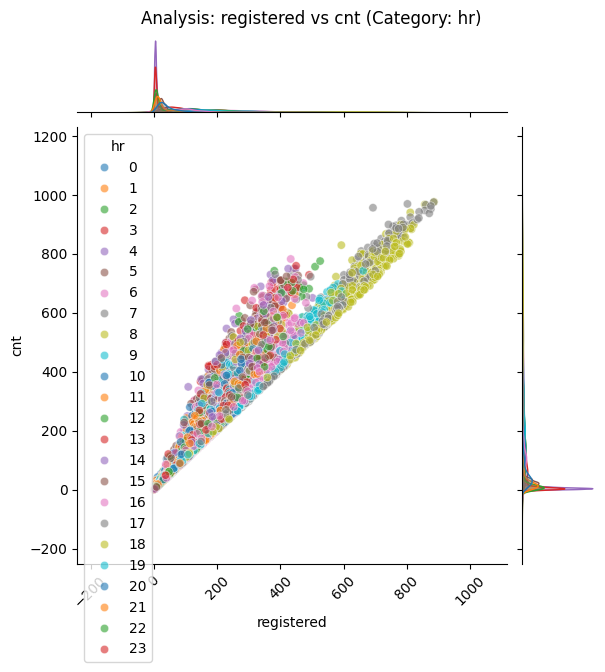

    TARGET_MEAN
hr             
0        53.898
1        33.376
2        22.870
3        11.727
4         6.353
5        19.890
6        76.044
7       212.065
8       359.011
9       219.309
10      173.669
11      208.143
12      253.316
13      253.661
14      240.949
15      251.233
16      311.984
17      461.452
18      425.511
19      311.523
20      226.030
21      172.315
22      131.335
23       87.831




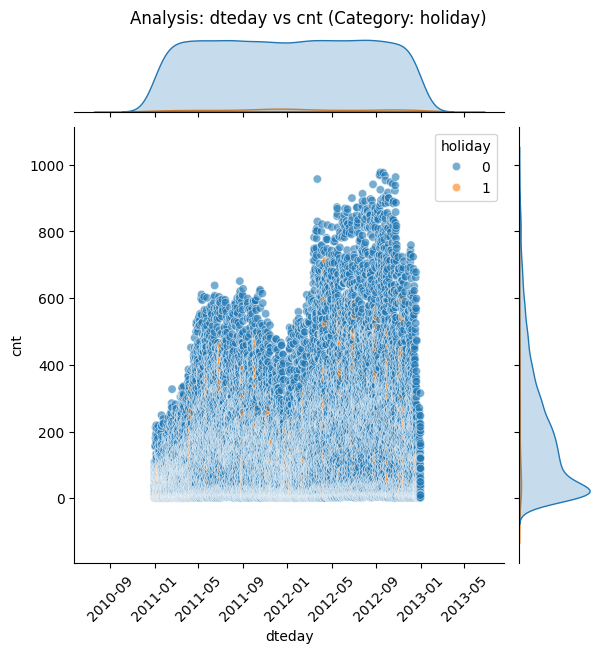

         TARGET_MEAN
holiday             
0            190.429
1            156.870




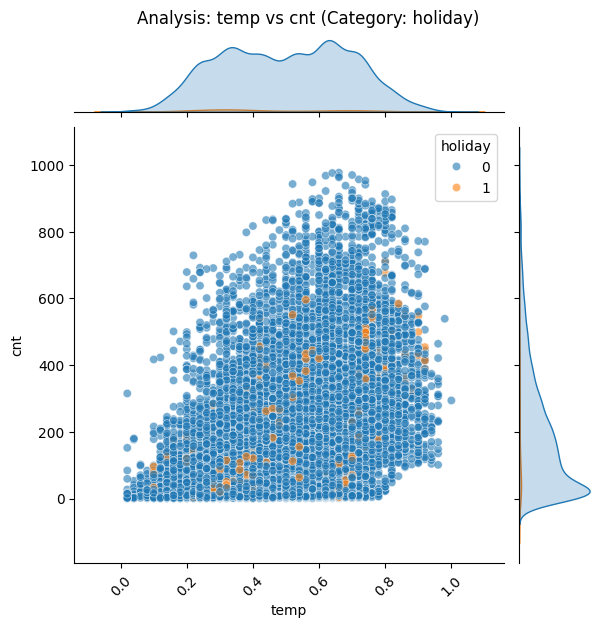

         TARGET_MEAN
holiday             
0            190.429
1            156.870




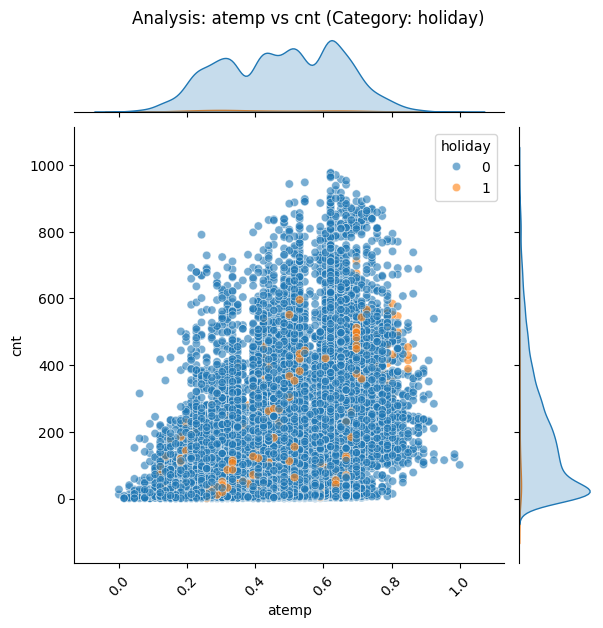

         TARGET_MEAN
holiday             
0            190.429
1            156.870




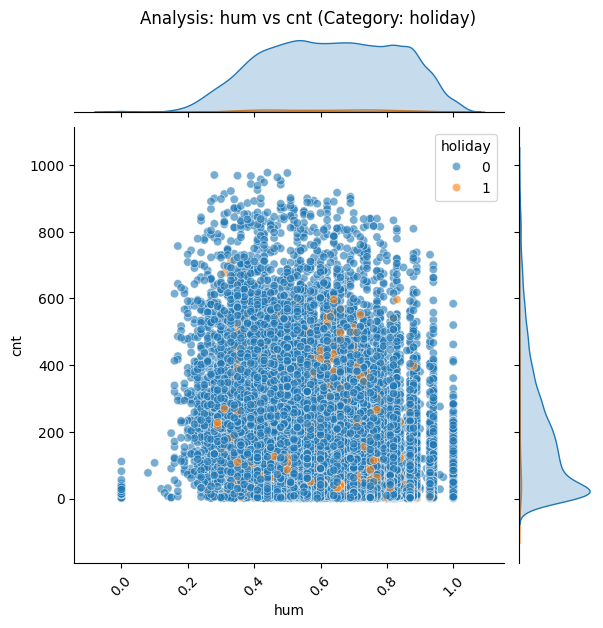

         TARGET_MEAN
holiday             
0            190.429
1            156.870




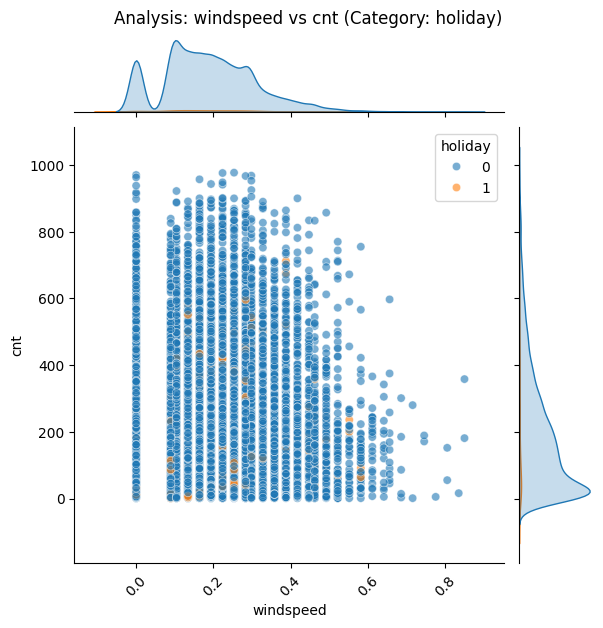

         TARGET_MEAN
holiday             
0            190.429
1            156.870




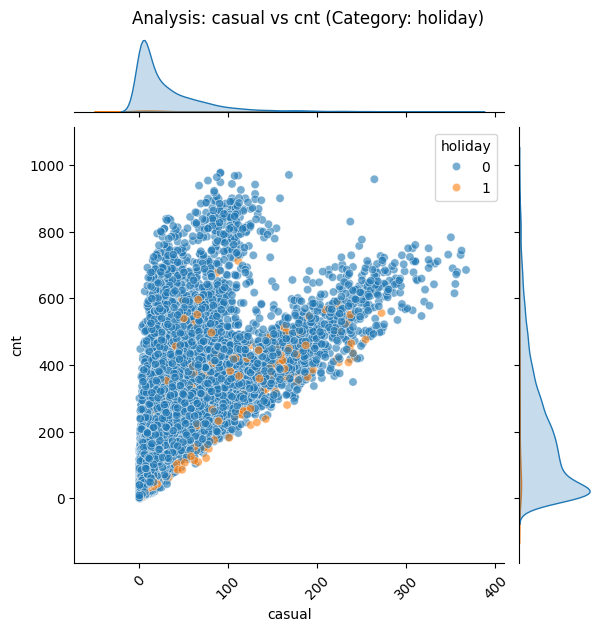

         TARGET_MEAN
holiday             
0            190.429
1            156.870




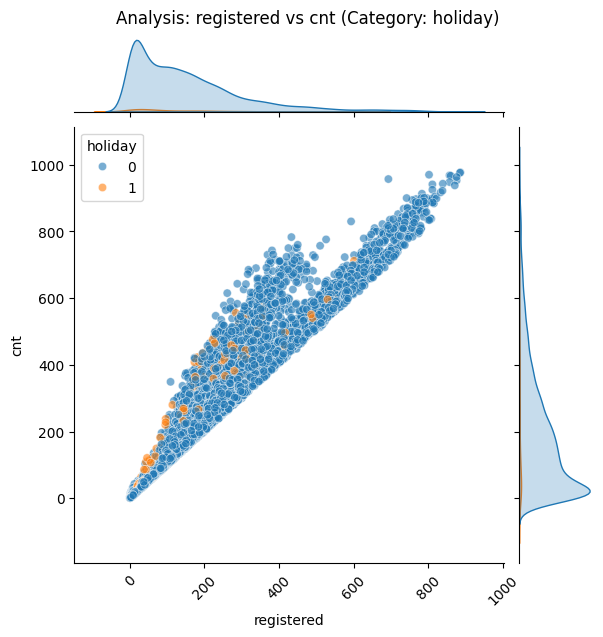

         TARGET_MEAN
holiday             
0            190.429
1            156.870




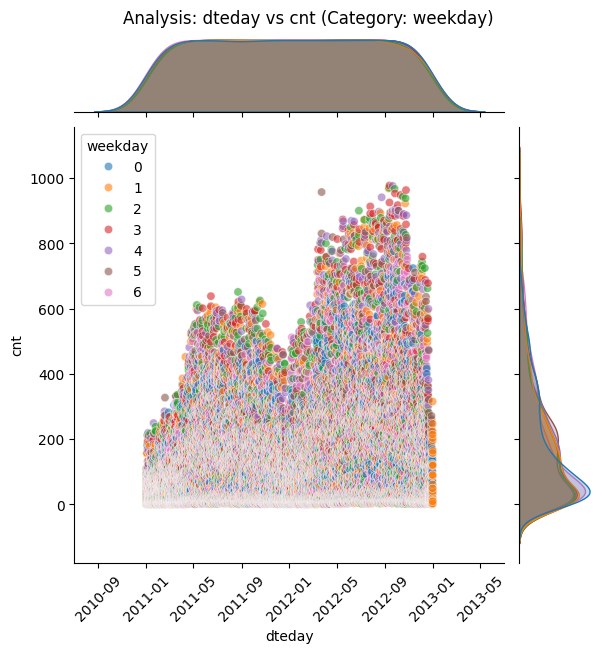

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




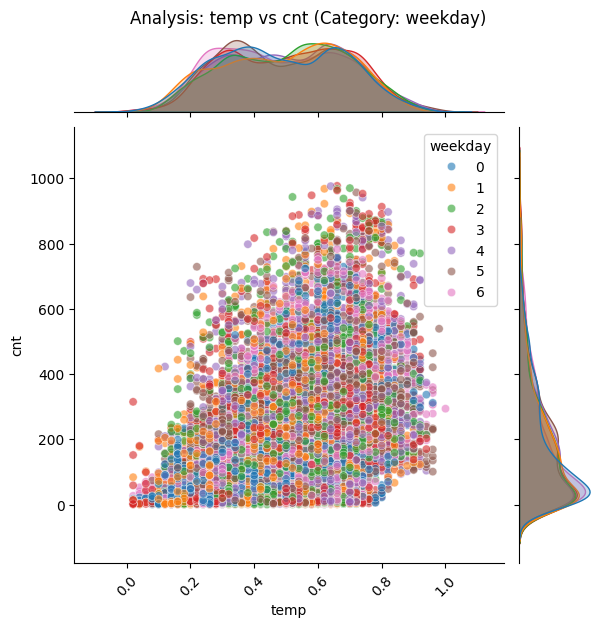

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




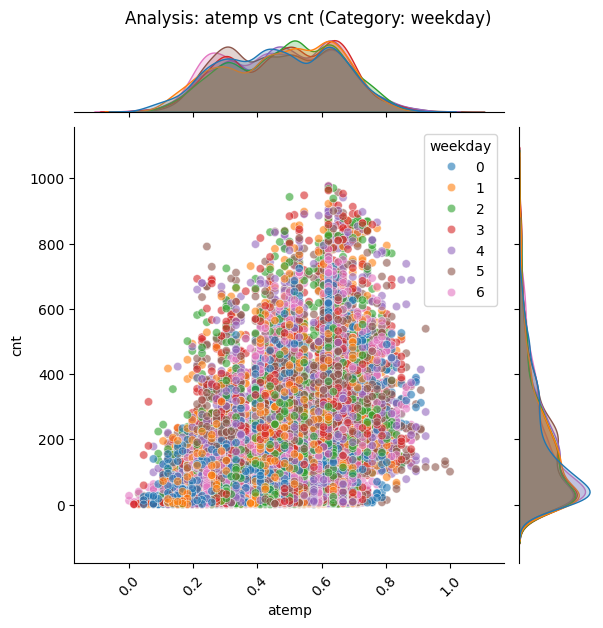

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




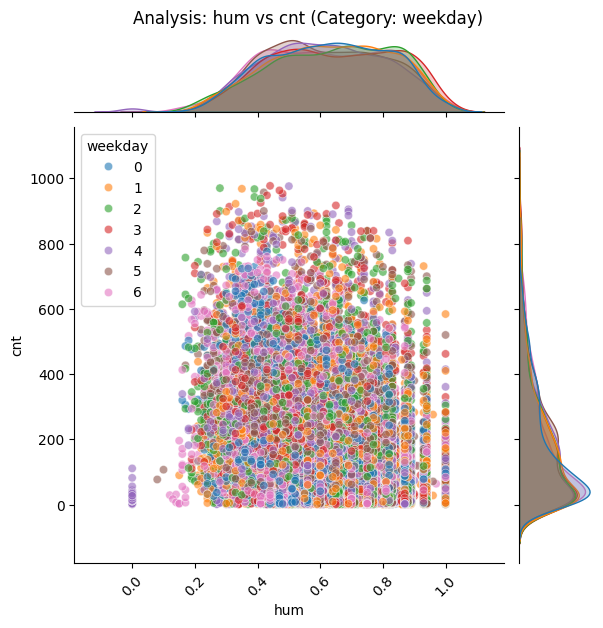

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




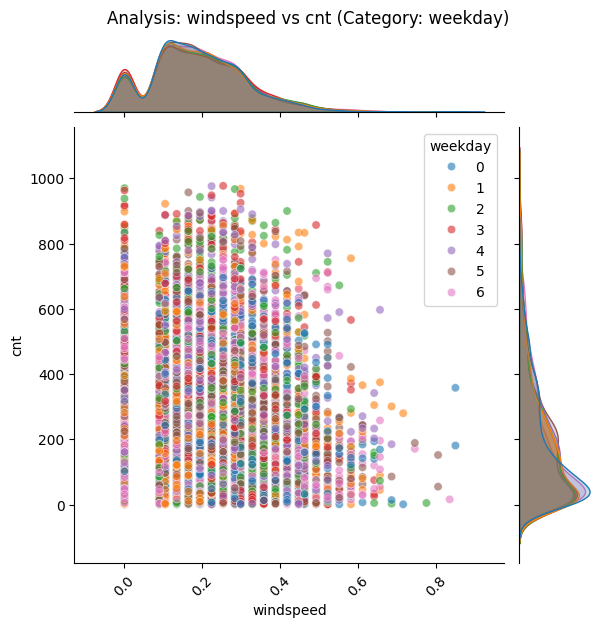

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




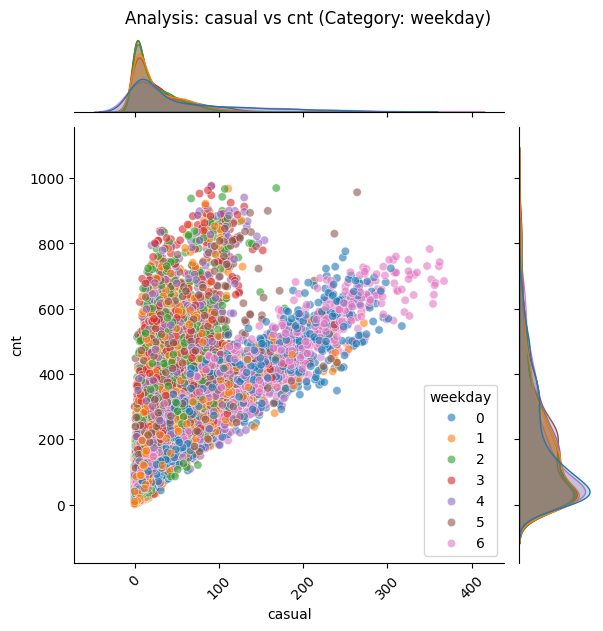

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




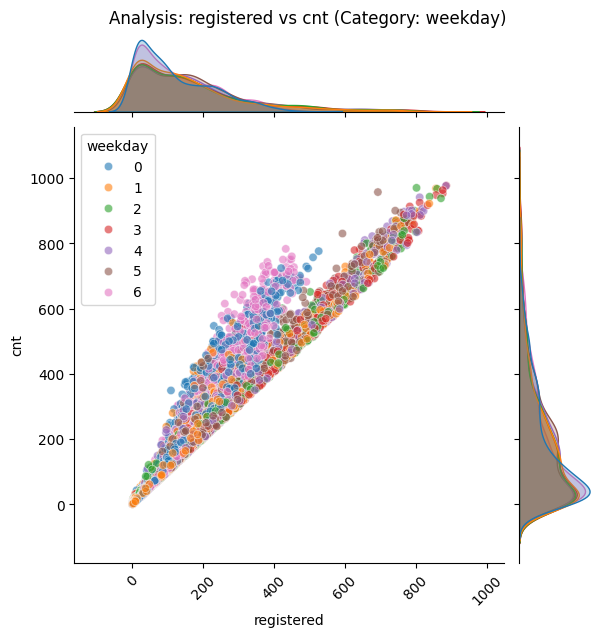

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




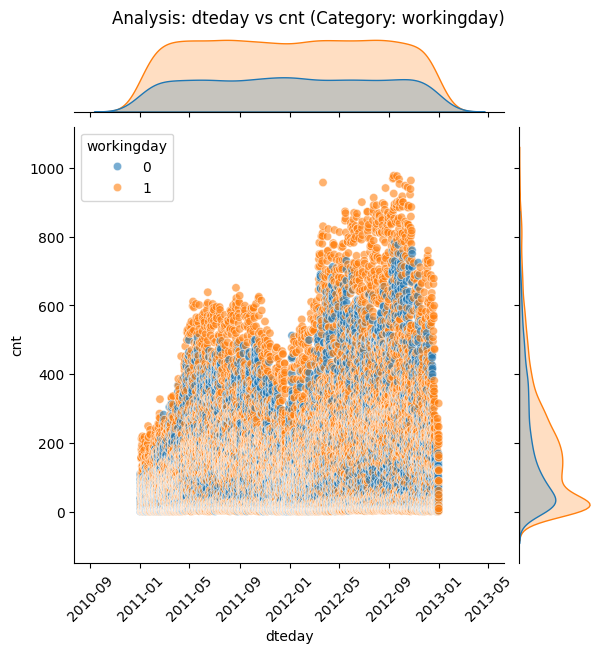

            TARGET_MEAN
workingday             
0               181.405
1               193.208




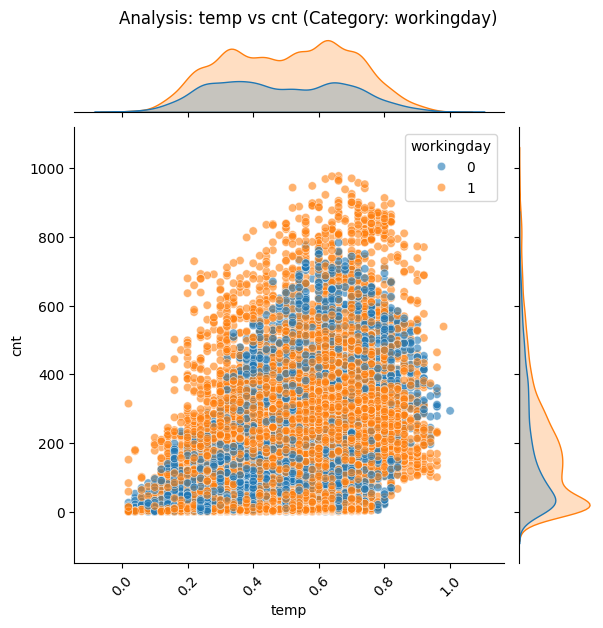

            TARGET_MEAN
workingday             
0               181.405
1               193.208




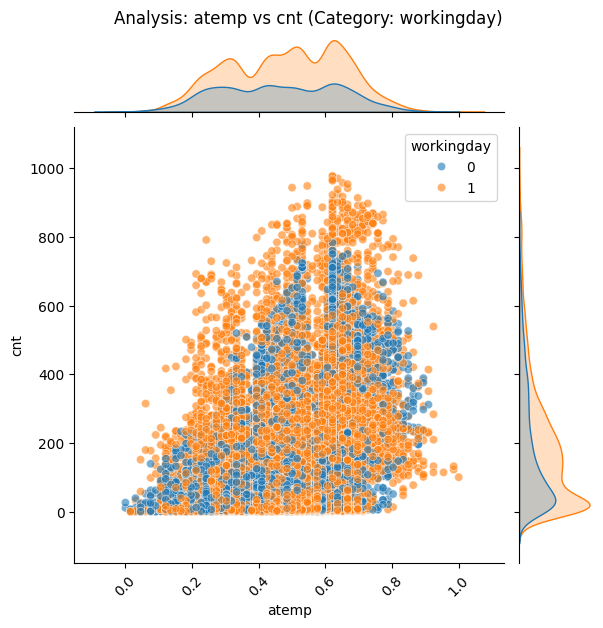

            TARGET_MEAN
workingday             
0               181.405
1               193.208




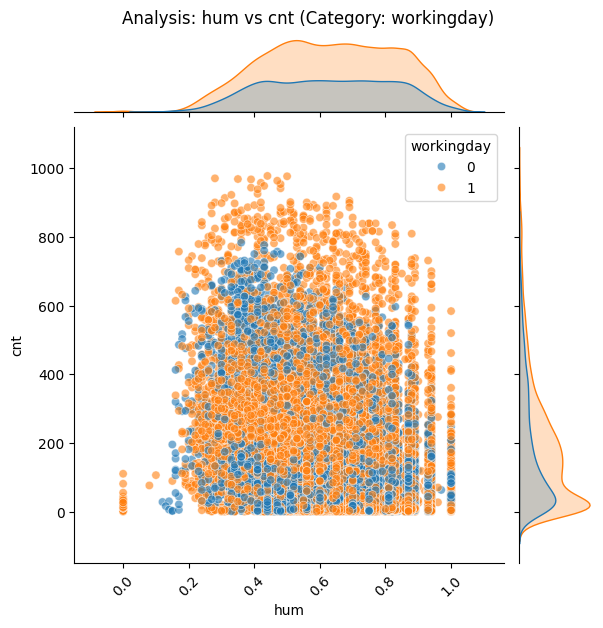

            TARGET_MEAN
workingday             
0               181.405
1               193.208




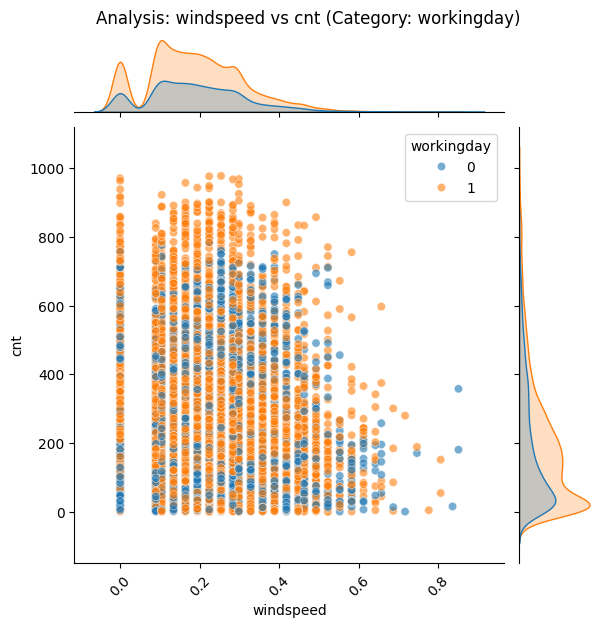

            TARGET_MEAN
workingday             
0               181.405
1               193.208




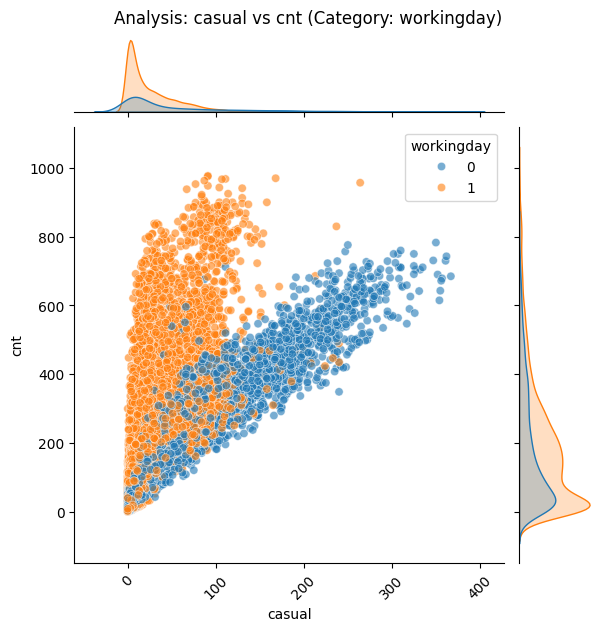

            TARGET_MEAN
workingday             
0               181.405
1               193.208




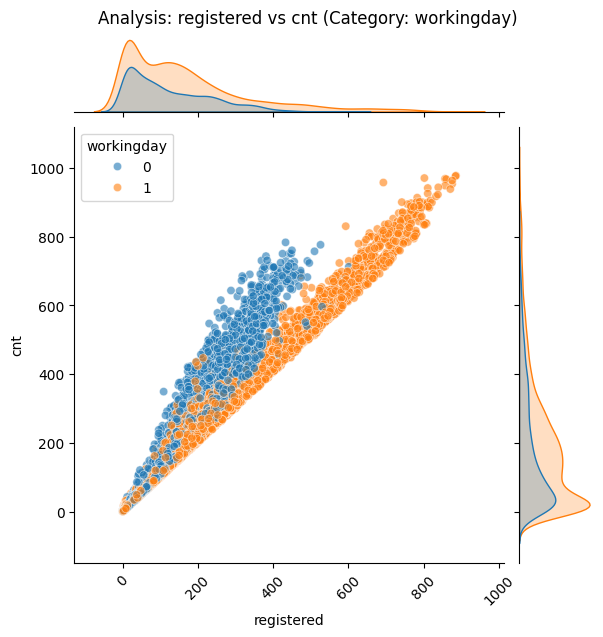

            TARGET_MEAN
workingday             
0               181.405
1               193.208




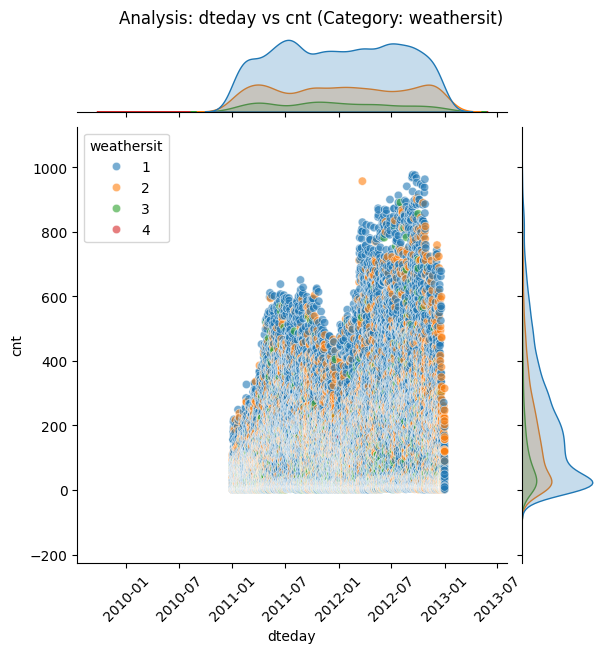

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




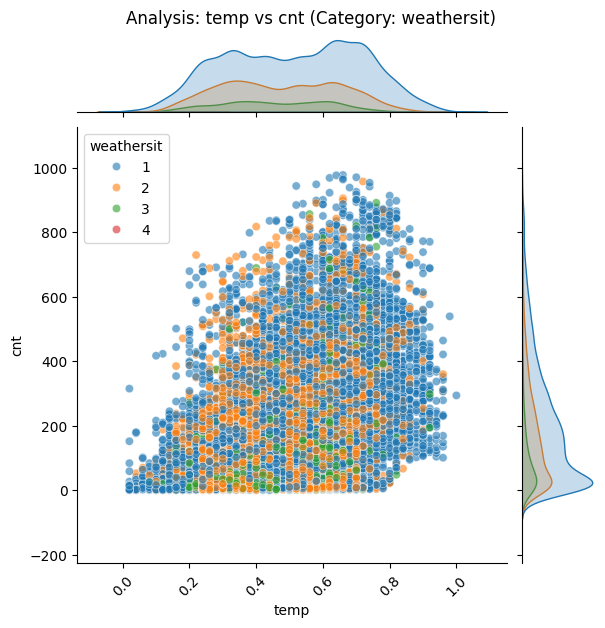

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




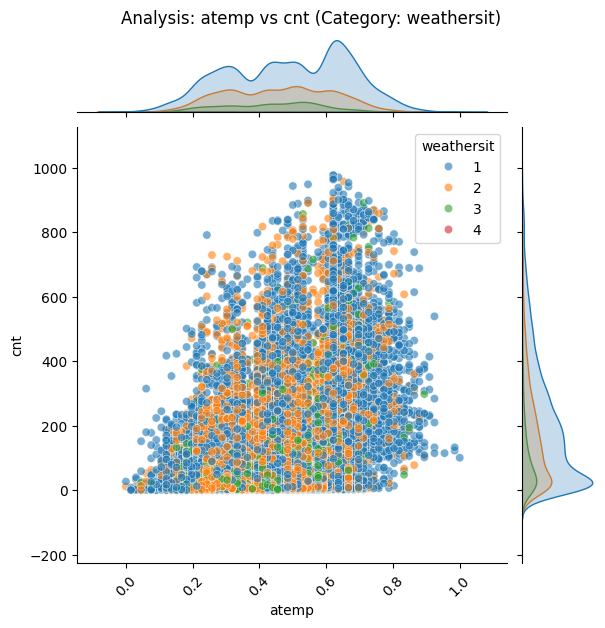

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




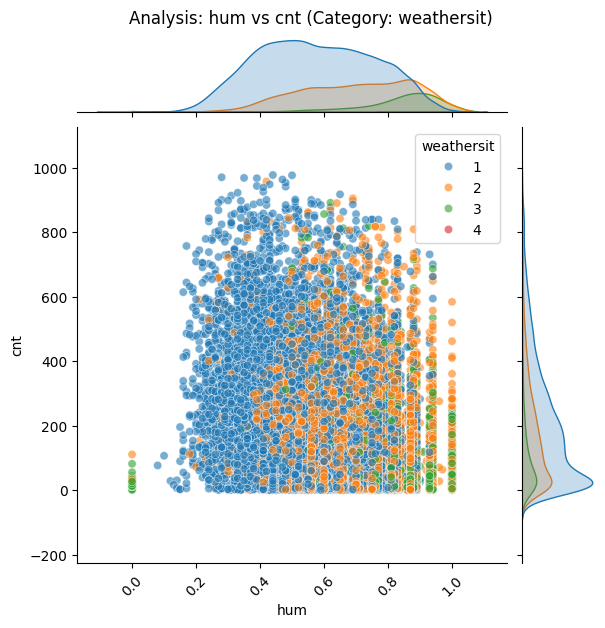

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




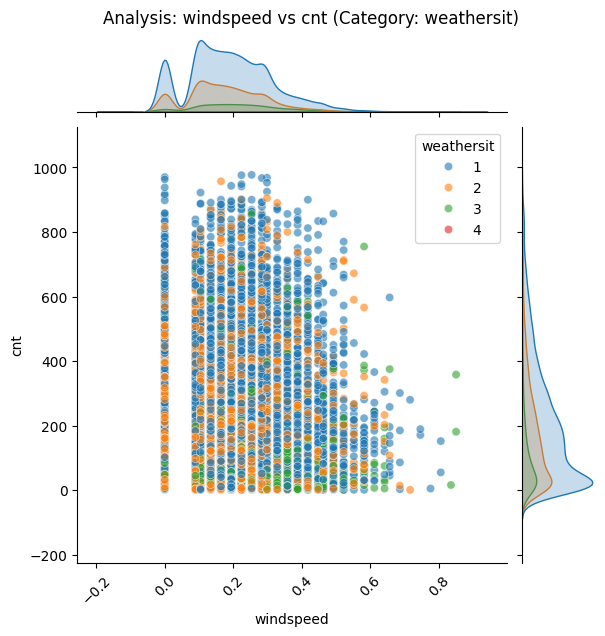

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




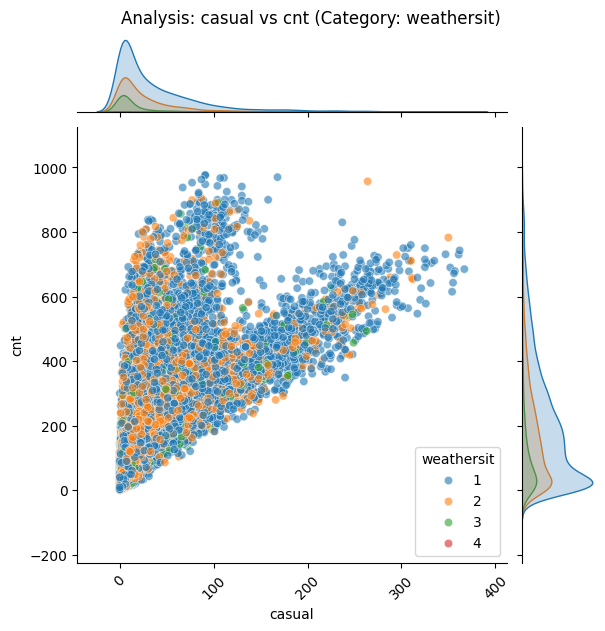

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




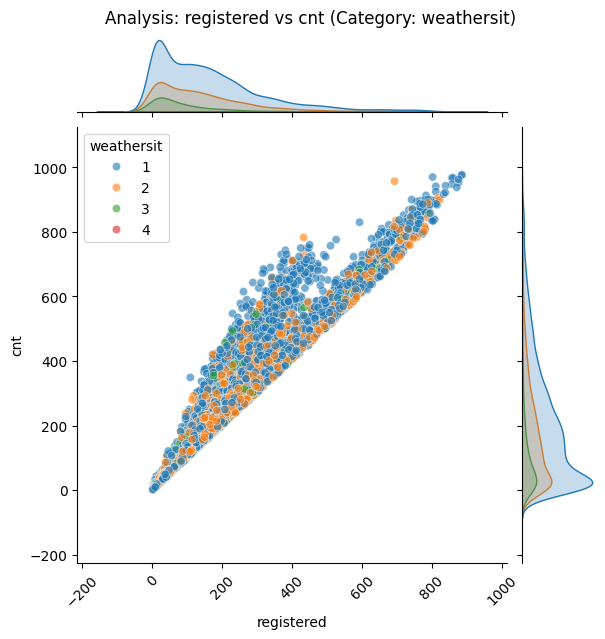

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




In [13]:
for catcol in cat_cols:
    target_nums = [col for col in num_cols if col not in ['cnt']]
    
    for numcol in target_nums:
        g = sns.jointplot(
            data=df_hourly,
            x=numcol, 
            y="cnt", 
            hue=catcol,
            kind="scatter",  
            alpha=0.6,       
            height=6,
            palette='tab10'         
        )
        
        g.figure.suptitle(f"Analysis: {numcol} vs cnt (Category: {catcol})", y=1.02)

        plt.xticks(rotation=45)
        
        plt.show()

        target_summary_with_cat(df_hourly, 'cnt', catcol)

#### Feature Correlations

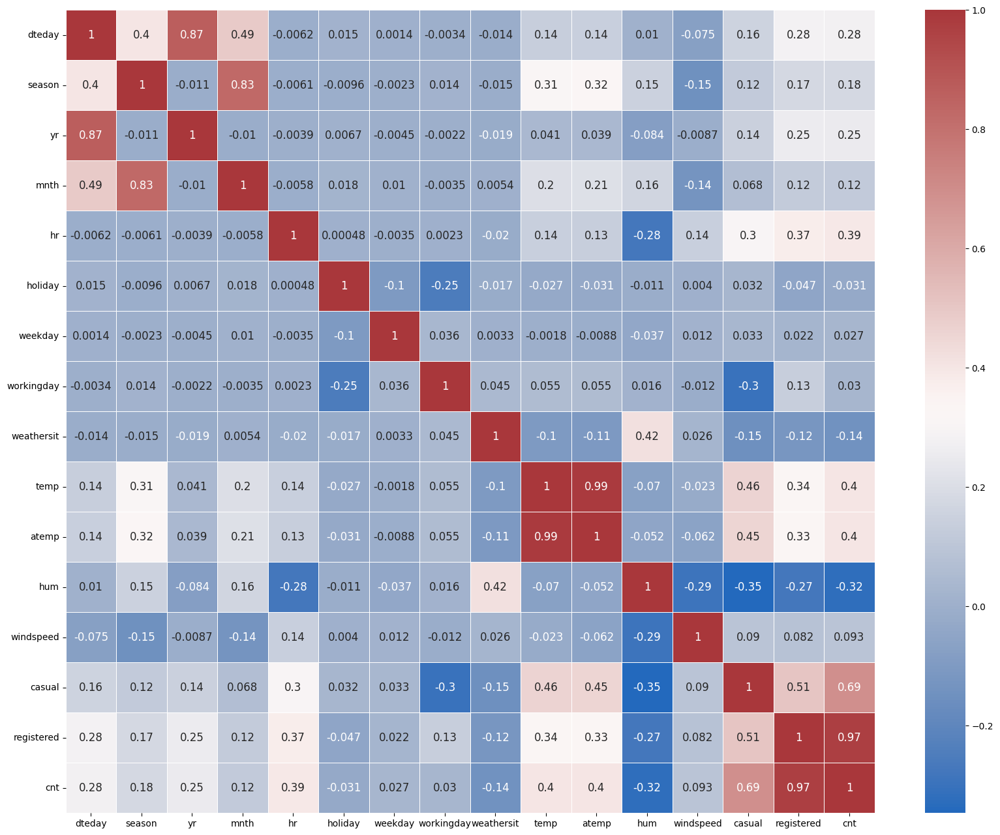

In [14]:
#correlation_matrix(df_hourly, [col for col in df_hourly.columns if col not in ['dteday']])
correlation_matrix(df_hourly, df_hourly.columns)

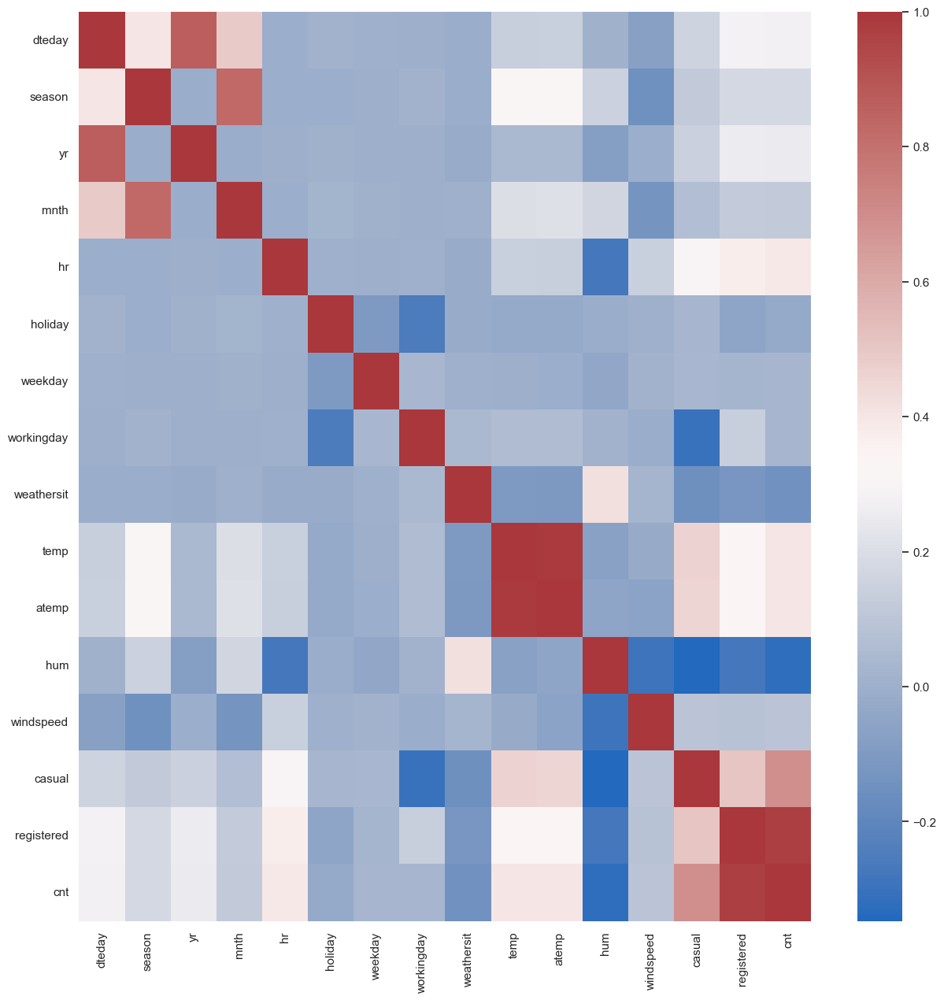

['season', 'yr', 'mnth', 'atemp', 'hum', 'casual', 'registered', 'cnt']

In [15]:
high_correlated_cols(df_hourly, True, 0.40)

### Outlier Detection

In [16]:
# Firstly transforming all features to raw forms to normalize as a whole later on
	#- temp : Normalized temperature in Celsius. The values are divided to 41 (max)
	#- atemp: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
	#- hum: Normalized humidity. The values are divided to 100 (max)
	#- windspeed: Normalized wind speed. The values are divided to 67 (max)

df_hourly['temp'] = df_hourly['temp'] * 41
df_hourly['atemp'] = df_hourly['atemp'] * 50
df_hourly['hum'] = df_hourly['hum'] * 100
df_hourly['windspeed'] = df_hourly['windspeed'] * 67

In [17]:
for col in [col for col in num_cols if col not in ['dteday']]:
    print(col + ' has outliers: ', check_outlier(df_hourly, col))

temp has outliers:  False
atemp has outliers:  False
hum has outliers:  True
windspeed has outliers:  True
casual has outliers:  True
registered has outliers:  True
cnt has outliers:  True


c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_utils\utils.py:204: FutureWarning: 'any' with datetime64 dtypes is deprecated and will raise in a future version. Use (obj != pd.Timestamp(0)).any() instead.
  return dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None)
c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_utils\utils.py:204: FutureWarning: 'any' with datetime64 dtypes is deprecated and will raise in a future version. Use (obj != pd.Timestamp(0)).any() instead.
  return dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None)
c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_utils\utils.py:204: FutureWarning: 'any' with datetime64 dtypes is deprecated and will raise in a future version. Use (obj != pd.Timestamp(0)).any() instead.
  return dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None)
c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_ut

In [18]:
for col in [col for col in num_cols if col not in ['dteday', 'cnt']]:
    replace_with_thresholds(df_hourly, col)

In [19]:
for col in [col for col in num_cols if col not in ['dteday']]:
    print(col + ' has outliers: ', check_outlier(df_hourly, col))

temp has outliers:  False
atemp has outliers:  False
hum has outliers:  False
windspeed has outliers:  False
casual has outliers:  False
registered has outliers:  False
cnt has outliers:  True


c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_utils\utils.py:204: FutureWarning: 'any' with datetime64 dtypes is deprecated and will raise in a future version. Use (obj != pd.Timestamp(0)).any() instead.
  return dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None)
c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_utils\utils.py:204: FutureWarning: 'any' with datetime64 dtypes is deprecated and will raise in a future version. Use (obj != pd.Timestamp(0)).any() instead.
  return dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None)
c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_utils\utils.py:204: FutureWarning: 'any' with datetime64 dtypes is deprecated and will raise in a future version. Use (obj != pd.Timestamp(0)).any() instead.
  return dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None)
c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_ut

In [20]:
df_hourly['cnt'] = df_hourly['registered'] + df_hourly['casual']

In [21]:
for col in [col for col in num_cols if col not in ['dteday']]:
    print(col + ' has outliers: ', check_outlier(df_hourly, col))

temp has outliers:  False
atemp has outliers:  False
hum has outliers:  False
windspeed has outliers:  False
casual has outliers:  False
registered has outliers:  False
cnt has outliers:  False


c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_utils\utils.py:204: FutureWarning: 'any' with datetime64 dtypes is deprecated and will raise in a future version. Use (obj != pd.Timestamp(0)).any() instead.
  return dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None)
c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_utils\utils.py:204: FutureWarning: 'any' with datetime64 dtypes is deprecated and will raise in a future version. Use (obj != pd.Timestamp(0)).any() instead.
  return dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None)
c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_utils\utils.py:204: FutureWarning: 'any' with datetime64 dtypes is deprecated and will raise in a future version. Use (obj != pd.Timestamp(0)).any() instead.
  return dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None)
c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_ut

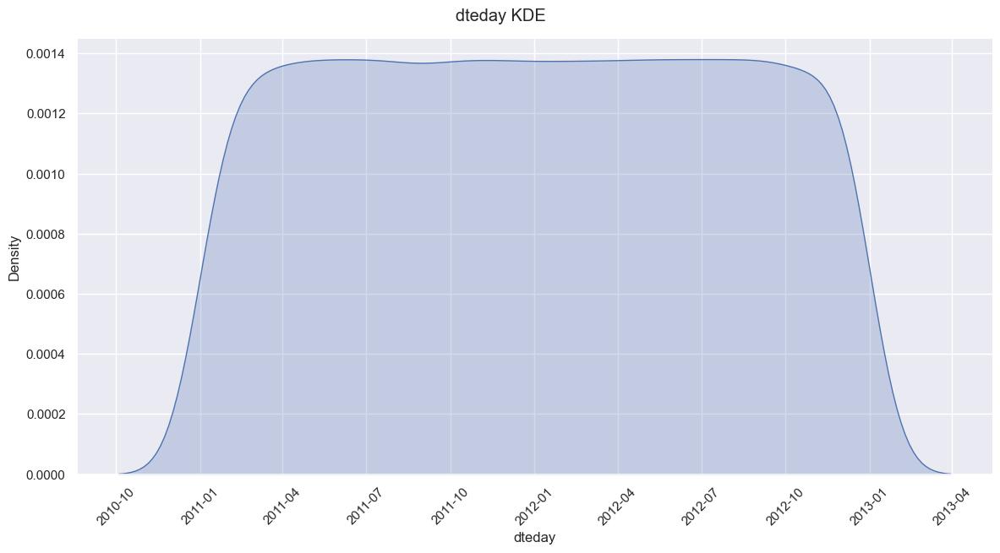

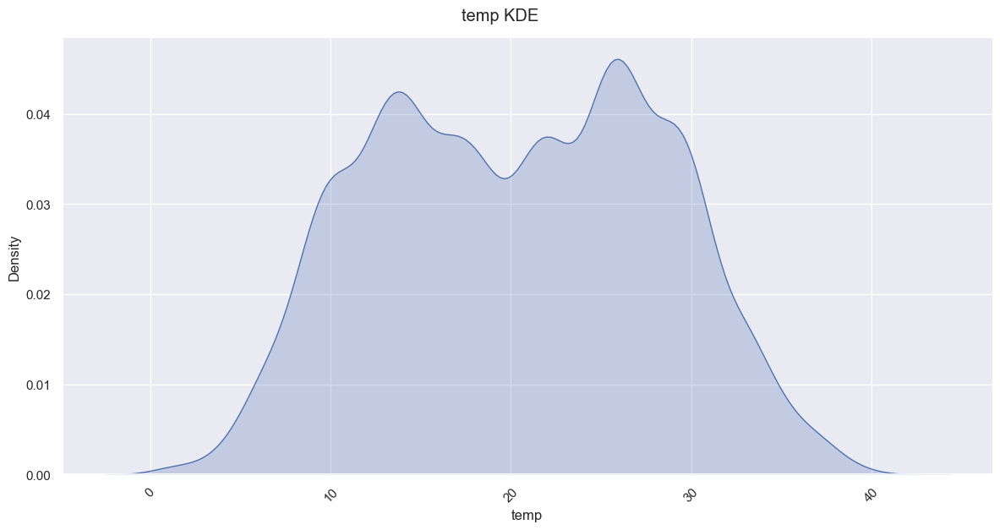

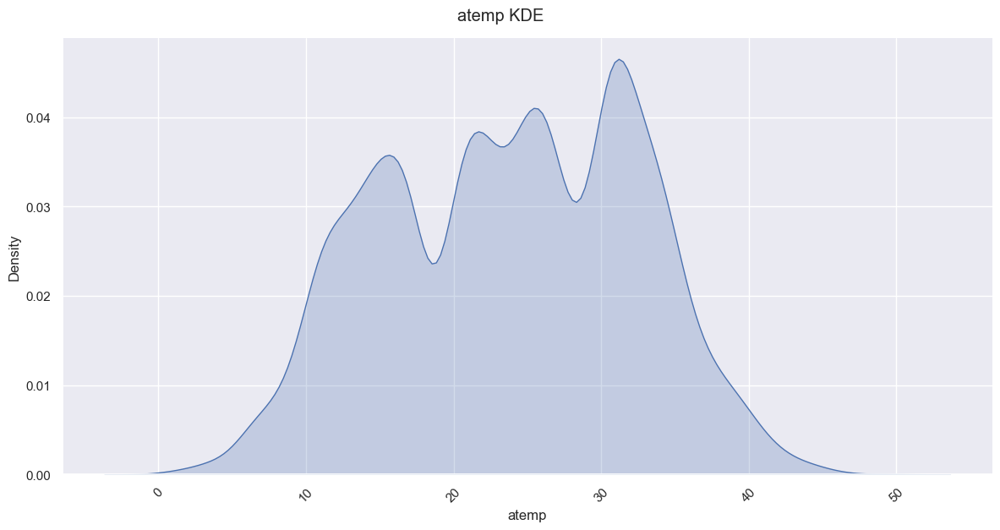

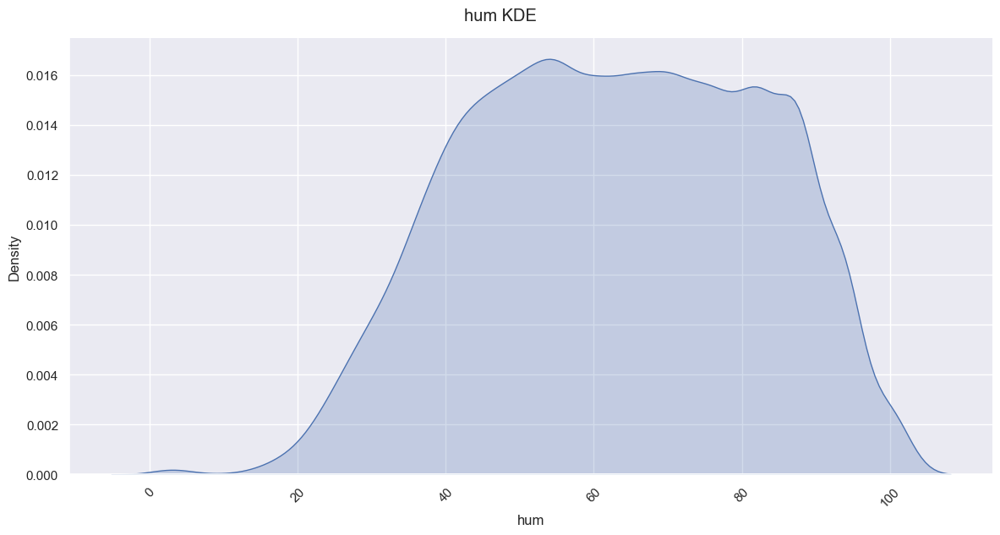

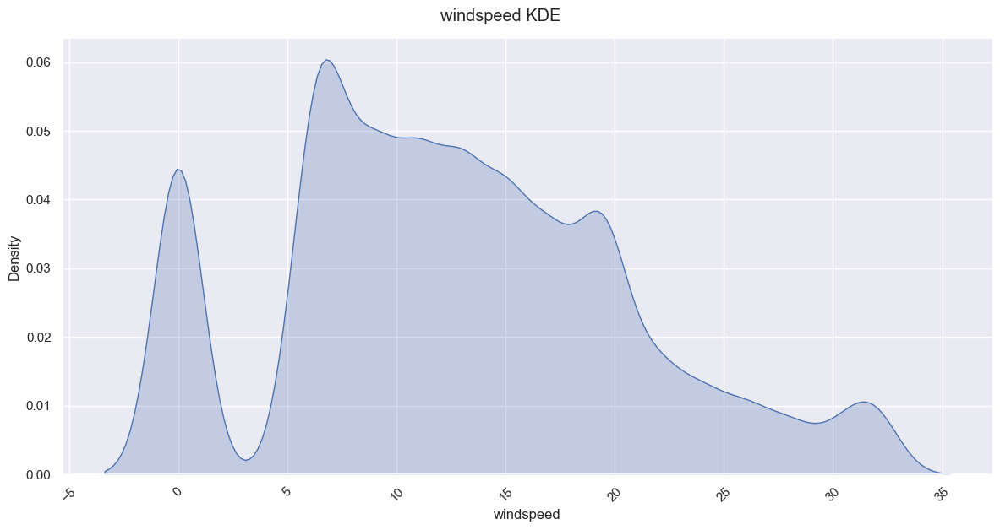

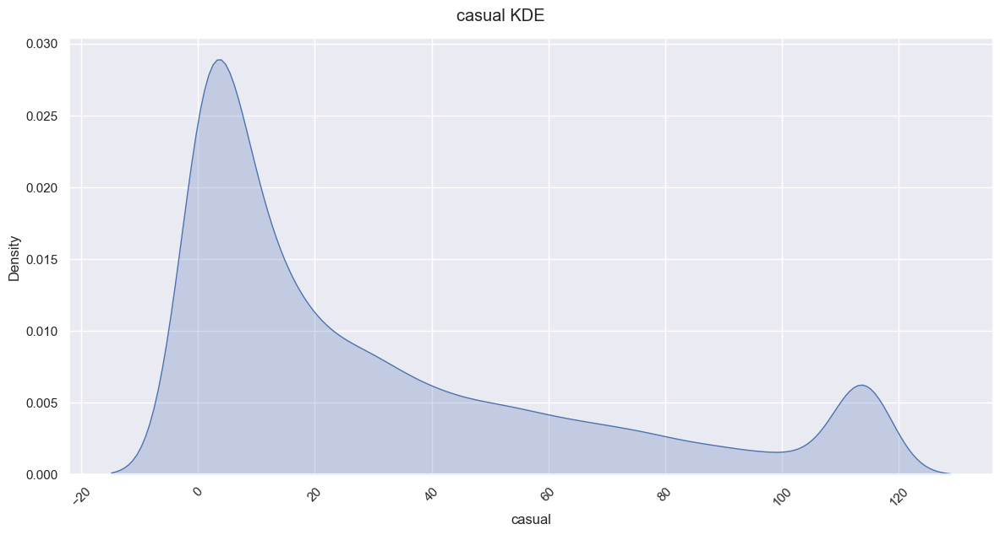

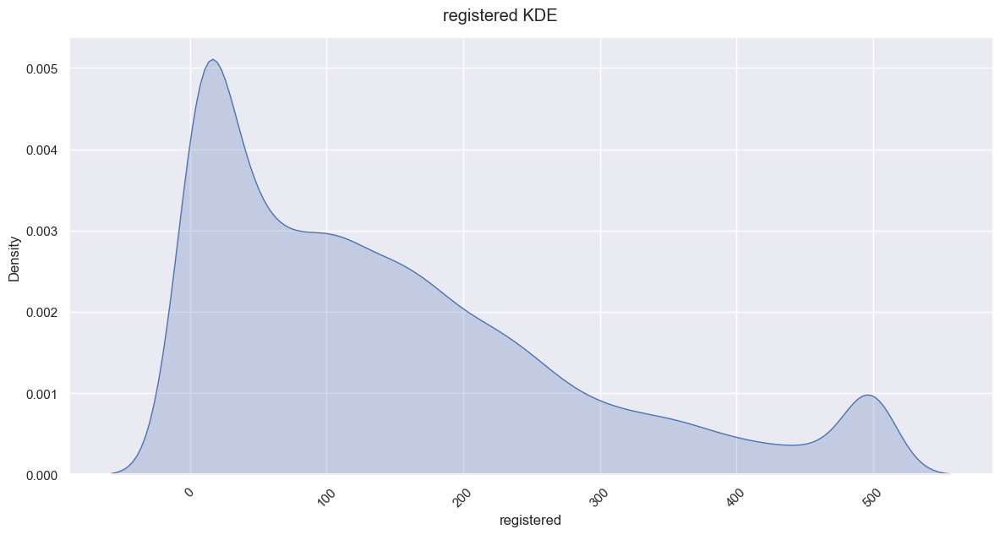

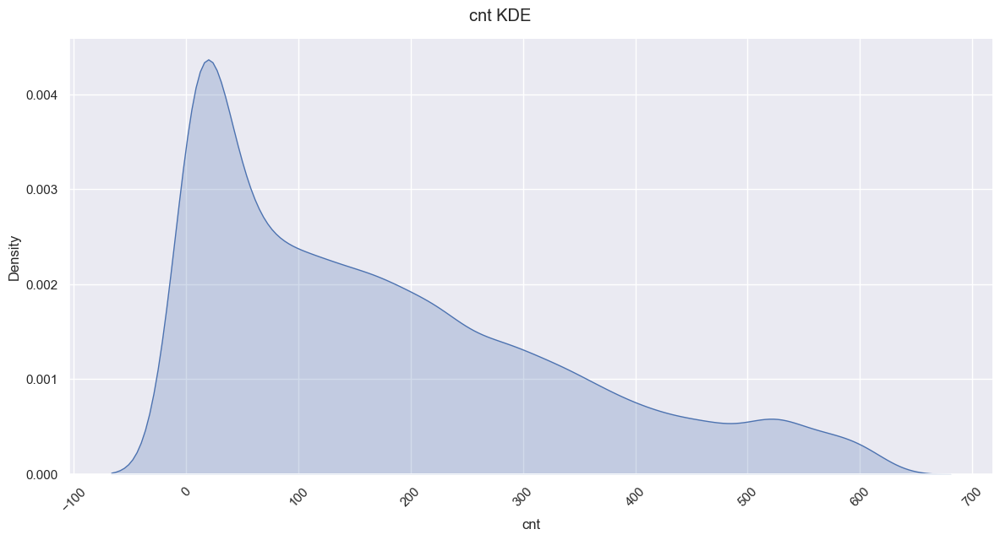

In [22]:
for col in num_cols:
    g = sns.displot(kind='kde', data=df_hourly, x=col, fill=True, height=6, aspect=2)
    g.figure.suptitle(col + " " + "KDE", y=1.03)
    plt.xticks(rotation=45)
    plt.show()

### Feature Engineering

In [23]:
# Discretization of hr column
hour_target_mean = df_hourly.groupby('hr')['cnt'].mean().sort_values()
bins = pd.qcut(hour_target_mean.values, q=4, labels=False, duplicates='drop')
bin_mapping = dict(zip(hour_target_mean.index, bins))
#bin_labels = {
    #0: 'low_activity_hours',
    #1: 'medium_activity_hours',
    #2: 'high_activity_hours',
    #3: 'very_high_activity_hours'
#}
    
df_hourly['NEW_hourly_activity_level'] = df_hourly['hr'].map(bin_mapping)

In [24]:
# month
month_target_mean = df_hourly.groupby('mnth')['cnt'].mean().sort_values()
bins_mnth = pd.qcut(month_target_mean.values, q=4, labels=False, duplicates='drop')
bin_mapping_mnth = dict(zip(month_target_mean.index, bins_mnth))
#bin_labels_mnth = {
    #0: 'low_activity_months',
    #1: 'medium_activity_months',
    #2: 'high_activity_months',
    #3: 'very_high_activity_months'
#}
df_hourly['NEW_monthly_activity_level'] = df_hourly['mnth'].map(bin_mapping_mnth)

In [25]:
# season
season_target_mean = df_hourly.groupby('season')['cnt'].mean()

# Rank 1: Spring - Average CNT: 111.12 - LOWEST ACTIVITY
# Rank 2: Winter - Average CNT: 198.87 - MEDIUM-LOW ACTIVITY
# Rank 3: Summer - Average CNT: 208.34 - MEDIUM-HIGH ACTIVITY
# Rank 4: Fall - Average CNT: 236.02 - HIGHEST ACTIVITY

# assign new values based on rank (rank based)
# rank(method='dense') kullanarak: en düşük mean = 1, en yüksek mean = 4
season_rank_mapping = season_target_mean.rank(method='dense').astype(int).to_dict()
df_hourly['NEW_season_ranked'] = df_hourly['season'].map(season_rank_mapping)

In [26]:
# weathersit
weathersit_reverse_mapping = {
    4: 1,  # Heavy Rain/Snow -> Rank 1 (worst weather, lowest cnt: 74.33)
    3: 2,  # Light Snow/Rain -> Rank 2 (bad weather, low cnt: 111.58)
    2: 3,  # Mist + Cloudy -> Rank 3 (moderate weather, medium cnt: 175.17)
    1: 4   # Clear -> Rank 4 (best weather, highest cnt: 204.87)
}

df_hourly['NEW_weathersit_ranked'] = df_hourly['weathersit'].map(weathersit_reverse_mapping)

In [27]:
# temp
# will be discretized into 2 bins since 2 density regions are visible in the distribution chart
df_hourly['temp_binned'] = pd.qcut(df_hourly['temp'], 
                                    q=2, 
                                    labels=['low_temp', 'high_temp'],
                                    duplicates='drop')

In [28]:
# atemp
# will be discretized into 3 bins since 3 density regions are visible in the distribution chart
df_hourly['atemp_binned'] = pd.qcut(df_hourly['atemp'], 
                                     q=3, 
                                     labels=['low_atemp', 'medium_atemp', 'high_atemp'],
                                     duplicates='drop')

In [29]:
# windspeed
# will be discretized into 4 bins since 4 density regions are visible in the distribution chart
df_hourly['windspeed_binned'] = pd.qcut(df_hourly['windspeed'], 
                                         q=4, 
                                         labels=['very_low_wind', 'low_wind', 
                                                'medium_wind', 'high_wind'],
                                         duplicates='drop')

In [30]:
discretized_cols = ['temp_binned', 'atemp_binned', 'windspeed_binned']

In [31]:
# target means of discretized_cols
for col in discretized_cols:
    target_summary_with_cat(df_hourly, 'cnt', col)

             TARGET_MEAN
temp_binned             
low_temp         127.575
high_temp        234.124


              TARGET_MEAN
atemp_binned             
low_atemp         107.147
medium_atemp      171.873
high_atemp        262.479


                  TARGET_MEAN
windspeed_binned             
very_low_wind         152.114
low_wind              182.128
medium_wind           200.412
high_wind             197.390




c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_utils\utils.py:110: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(pd.DataFrame({"TARGET_MEAN": dataframe.groupby(categorical_col)[target].mean()}), end="\n\n\n")
c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_utils\utils.py:110: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(pd.DataFrame({"TARGET_MEAN": dataframe.groupby(categorical_col)[target].mean()}), end="\n\n\n")
c:\Dev\Repos\Bike_Sharing_Demand_Prediction\data_and_utils\utils.py:110: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future ve

In [ ]:
temp_rank_mapping = {
    'low_temp': 1,   # Lowest CNT
    'high_temp': 2   # Highest CNT
}

df_hourly['NEW_temp_ranked'] = df_hourly['temp_binned'].map(temp_rank_mapping).astype(int)

atemp_rank_mapping = {
    'low_atemp': 1,      # Lowest CNT
    'medium_atemp': 2,   # Medium CNT
    'high_atemp': 3      # Highest CNT
}

df_hourly['NEW_atemp_ranked'] = df_hourly['atemp_binned'].map(atemp_rank_mapping).astype(int)


windspeed_target_means = {
    'very_low_wind': 152.114,
    'low_wind': 182.128,
    'medium_wind': 200.412,
    'high_wind': 197.390
}

sorted_windspeed = sorted(windspeed_target_means.items(), key=lambda x: x[1])
windspeed_rank_mapping = {name: idx+1 for idx, (name, _) in enumerate(sorted_windspeed)}


windspeed_rank_mapping = {
    'very_low_wind': 1,  # Lowest CNT (152.114)
    'low_wind': 2,       # Medium-low CNT (182.128)
    'high_wind': 3,      # Medium-high CNT (197.390)
    'medium_wind': 4     # Highest CNT (200.412)
}

df_hourly['NEW_windspeed_ranked'] = df_hourly['windspeed_binned'].map(windspeed_rank_mapping).astype(int)

In [33]:
check_df(df_hourly)

##################### Shape #####################
(17379, 26)
##################### Types #####################
dteday                        datetime64[ns]
season                                 int64
yr                                     int64
mnth                                   int64
hr                                     int64
holiday                                int64
weekday                                int64
workingday                             int64
weathersit                             int64
temp                                 float64
atemp                                float64
hum                                  float64
windspeed                            float64
casual                                 int64
registered                             int64
cnt                                    int64
NEW_hourly_activity_level              int64
NEW_monthly_activity_level             int64
NEW_season_ranked                      int64
NEW_weathersit_ranked            

C:\Users\borab\AppData\Local\Temp\ipykernel_15484\3938251482.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y1, kde=False, fit=stats.norm)


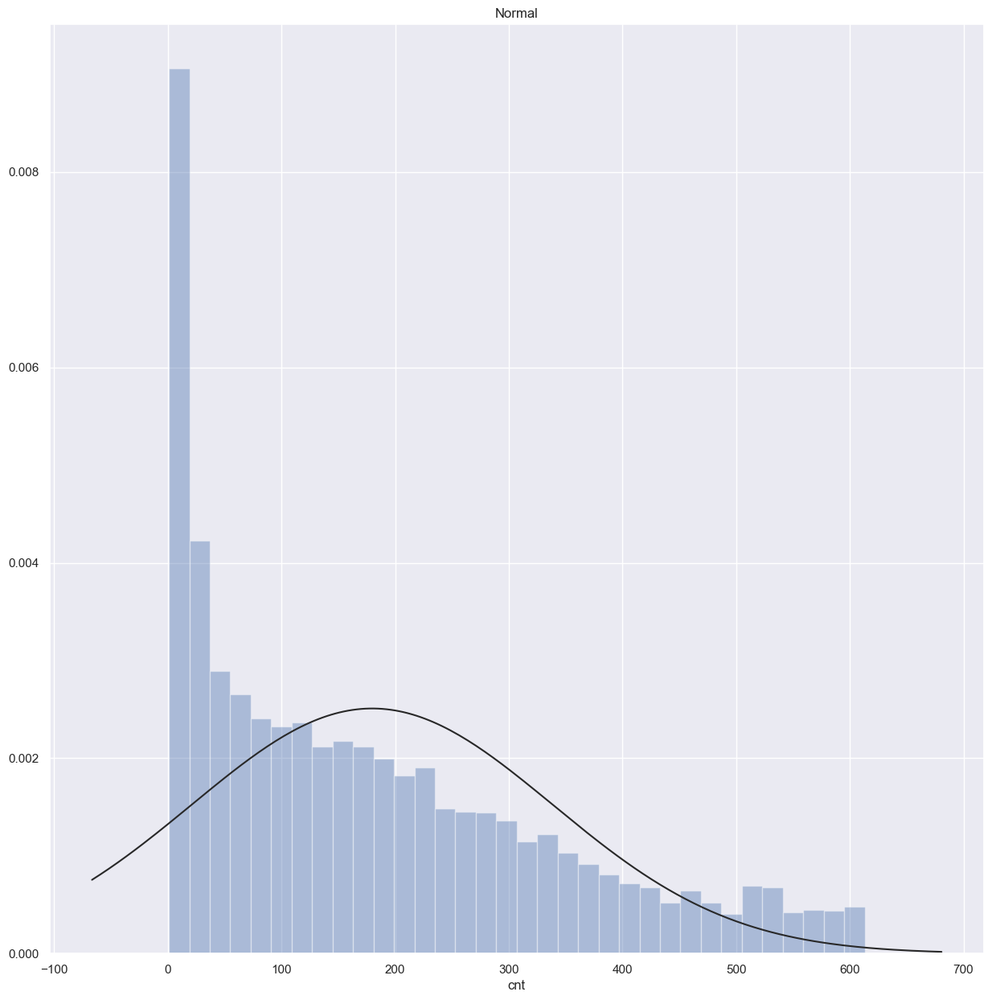

C:\Users\borab\AppData\Local\Temp\ipykernel_15484\3938251482.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y1, kde=False, fit=stats.lognorm)


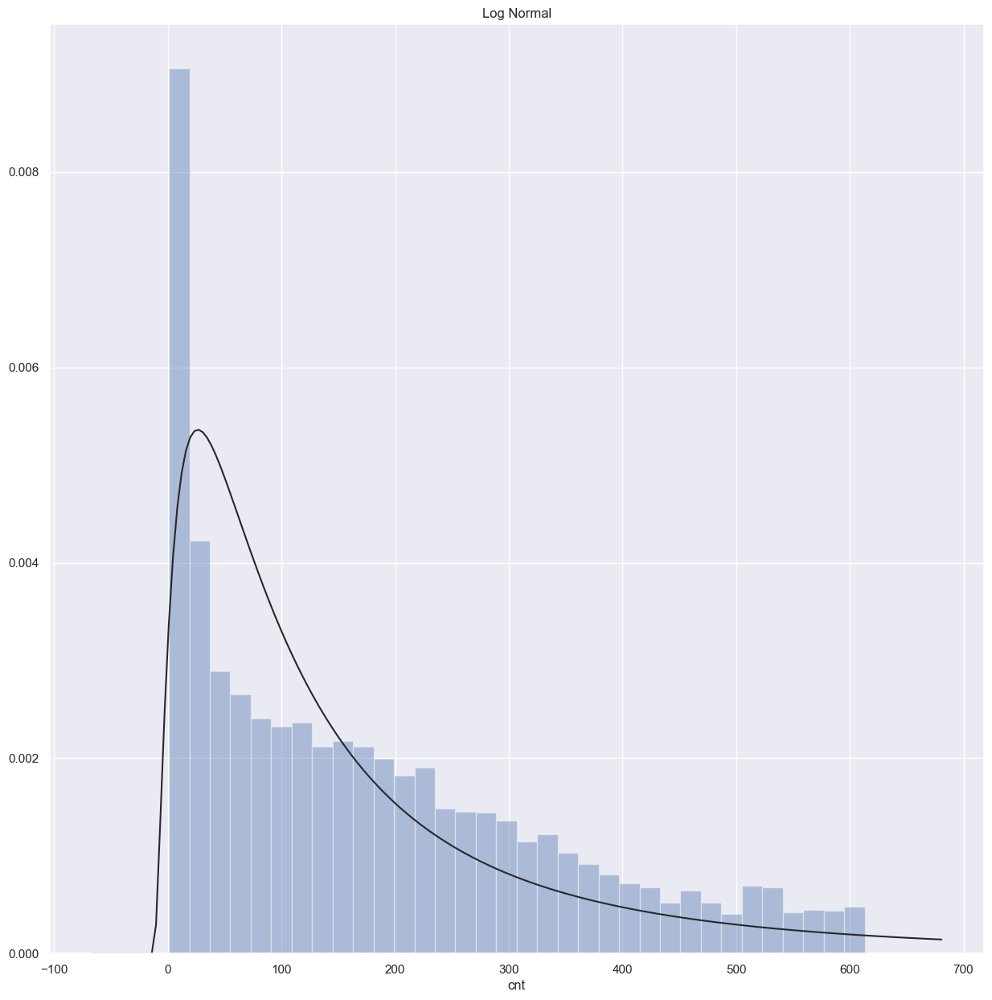

In [34]:
import scipy.stats as stats

y1 = df_hourly['cnt']
plt.figure(2); plt.title('Normal')
sns.distplot(y1, kde=False, fit=stats.norm)
plt.show()
plt.figure(3); plt.title('Log Normal')
sns.distplot(y1, kde=False, fit=stats.lognorm)
plt.show()

**OBSERVATION**
- Distribution of target fits log normal rather than normal curve.
- Transformation can be considered

# Model Construction

In [48]:
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import warnings
warnings.filterwarnings('ignore')

### Feature Selection
- Our aim is to model the data linearly and spectating the linear model's (Ridge, Lasso) capability to select features.
- Thus Feature Engineering section was focused on creating linearly definable features
- Non-linear features and the features with less or no correlations with the target will be pre-eliminated.
- 'Registered' and 'Casual' columns will be removed as they are components of the target variable

In [40]:
final_features = [col for col in df_hourly.columns if 'NEW' in col]
final_features.extend(['hum', 'workingday', 'yr', 'cnt'])
print(final_features)

['NEW_hourly_activity_level', 'NEW_monthly_activity_level', 'NEW_season_ranked', 'NEW_weathersit_ranked', 'NEW_temp_ranked', 'NEW_atemp_ranked', 'NEW_windspeed_ranked', 'hum', 'workingday', 'yr', 'cnt']


In [41]:
check_df(df_hourly[final_features])

##################### Shape #####################
(17379, 11)
##################### Types #####################
NEW_hourly_activity_level       int64
NEW_monthly_activity_level      int64
NEW_season_ranked               int64
NEW_weathersit_ranked           int64
NEW_temp_ranked                 int64
NEW_atemp_ranked                int64
NEW_windspeed_ranked            int64
hum                           float64
workingday                      int64
yr                              int64
cnt                             int64
dtype: object
##################### Head #####################
         NEW_hourly_activity_level  NEW_monthly_activity_level  NEW_season_ranked  NEW_weathersit_ranked  NEW_temp_ranked  NEW_atemp_ranked  NEW_windspeed_ranked    hum  workingday  yr  cnt
instant                                                                                                                                                                                      
1                          

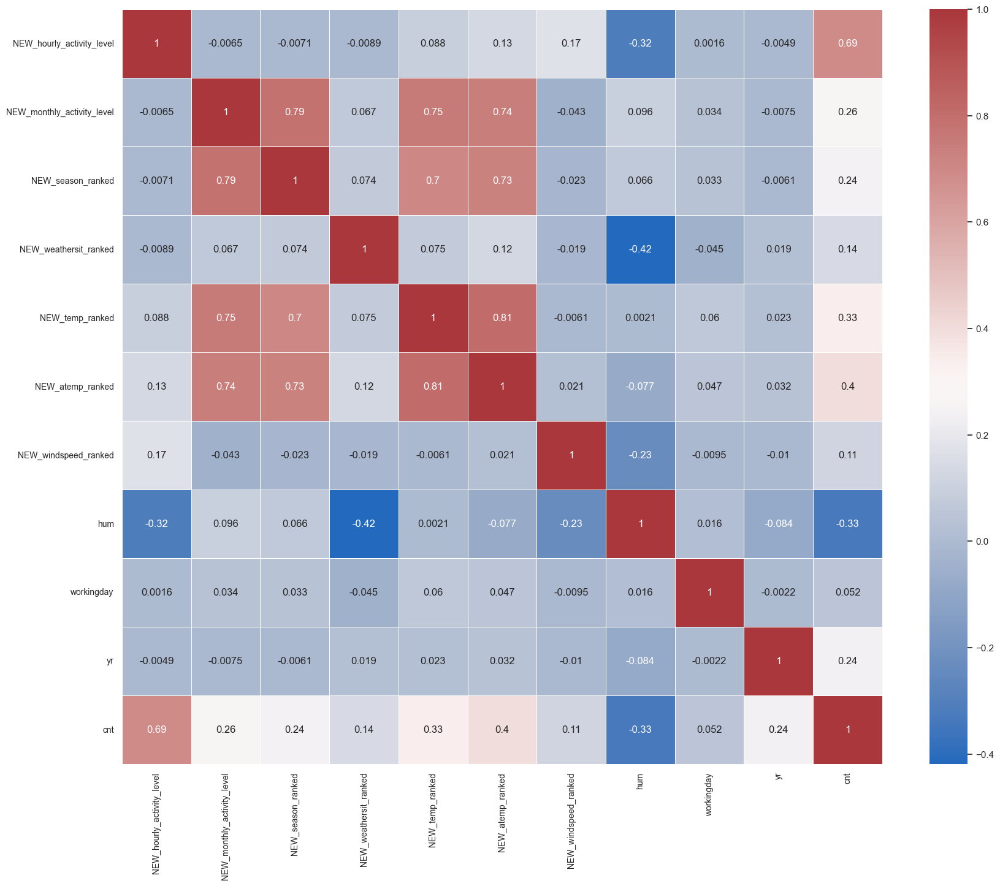

In [42]:
correlation_matrix(df_hourly, final_features)

**OBSERVATIONS**
- Compared to previous correlation matrix, a matrix packed with more related features can be observed.

In [93]:
X = df_hourly[final_features].drop(columns=['cnt'])
y = np.log(df_hourly['cnt'])
y_original = df_hourly['cnt']

In [94]:
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X)

In [95]:
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X_poly, y, test_size=0.15, random_state=42
)
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=0.176, random_state=42
)

# Original (non-log) split
y_original_train_val, y_original_test = train_test_split(
    y_original, test_size=0.15, random_state=42
)
y_original_train, y_original_val = train_test_split(
    y_original_train_val, test_size=0.176, random_state=42
)

print(f"Training:   {X_train.shape[0]:>5} samples ({X_train.shape[0]/len(X)*100:>5.1f}%)")
print(f"Validation: {X_val.shape[0]:>5} samples ({X_val.shape[0]/len(X)*100:>5.1f}%)")
print(f"Test:       {X_test.shape[0]:>5} samples ({X_test.shape[0]/len(X)*100:>5.1f}%)")

Training:   12172 samples ( 70.0%)
Validation:  2600 samples ( 15.0%)
Test:        2607 samples ( 15.0%)


In [96]:
# Data standardized (mean=0, std=1)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

In [97]:
results = {}

**OLS**

In [98]:
ols_model = LinearRegression()
ols_model.fit(X_train_scaled, y_train)

y_train_pred_ols = ols_model.predict(X_train_scaled)
y_val_pred_ols = ols_model.predict(X_val_scaled)

In [99]:
results['OLS'] = {
    'train_rmse': np.sqrt(mean_squared_error(y_train, y_train_pred_ols)),
    'train_mae': mean_absolute_error(y_train, y_train_pred_ols),
    'train_r2': r2_score(y_train, y_train_pred_ols),
    'val_rmse': np.sqrt(mean_squared_error(y_val, y_val_pred_ols)),
    'val_mae': mean_absolute_error(y_val, y_val_pred_ols),
    'val_r2': r2_score(y_val, y_val_pred_ols),
    'model': ols_model
}

In [100]:
y_train_pred_ols_real = np.exp(y_train_pred_ols)
y_val_pred_ols_real = np.exp(y_val_pred_ols)

In [101]:
# Real-space metrics
results['OLS']['train_rmse_real'] = np.sqrt(mean_squared_error(y_original_train, y_train_pred_ols_real))
results['OLS']['train_mae_real'] = mean_absolute_error(y_original_train, y_train_pred_ols_real)
results['OLS']['train_r2_real'] = r2_score(y_original_train, y_train_pred_ols_real)
results['OLS']['val_rmse_real'] = np.sqrt(mean_squared_error(y_original_val, y_val_pred_ols_real))
results['OLS']['val_mae_real'] = mean_absolute_error(y_original_val, y_val_pred_ols_real)
results['OLS']['val_r2_real'] = r2_score(y_original_val, y_val_pred_ols_real)

In [102]:
print(f"LOG-SPACE:")
print(f"Training   - RMSE: {results['OLS']['train_rmse']:>7.4f}, MAE: {results['OLS']['train_mae']:>7.4f}, R²: {results['OLS']['train_r2']:>6.4f}")
print(f"Validation - RMSE: {results['OLS']['val_rmse']:>7.4f}, MAE: {results['OLS']['val_mae']:>7.4f}, R²: {results['OLS']['val_r2']:>6.4f}")
print(f"\nREAL-SPACE (gerçek cnt değerleri):")
print(f"Training   - RMSE: {results['OLS']['train_rmse_real']:>7.2f}, MAE: {results['OLS']['train_mae_real']:>7.2f}, R²: {results['OLS']['train_r2_real']:>6.4f}")
print(f"Validation - RMSE: {results['OLS']['val_rmse_real']:>7.2f}, MAE: {results['OLS']['val_mae_real']:>7.2f}, R²: {results['OLS']['val_r2_real']:>6.4f}")

LOG-SPACE:
Training   - RMSE:  0.7194, MAE:  0.5419, R²: 0.7627
Validation - RMSE:  0.7149, MAE:  0.5314, R²: 0.7466

REAL-SPACE (gerçek cnt değerleri):
Training   - RMSE:   88.91, MAE:   63.02, R²: 0.6930
Validation - RMSE:   85.03, MAE:   60.50, R²: 0.6989


**RIDGE**

In [103]:
alphas_ridge = np.logspace(-3, 3, 50)
ridge_cv = GridSearchCV(Ridge(), {'alpha': alphas_ridge}, cv=5, 
                        scoring='neg_root_mean_squared_error', n_jobs=-1)
ridge_cv.fit(X_train_scaled, y_train)

,estimator,Ridge()
,param_grid,{'alpha': array([1.0000...00000000e+03])}
,scoring,'neg_root_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,np.float64(2.023589647725158)


In [104]:
best_ridge = ridge_cv.best_estimator_
print(f"Best alpha: {ridge_cv.best_params_['alpha']:.4f}")

Best alpha: 2.0236


In [105]:
y_train_pred_ridge = best_ridge.predict(X_train_scaled)
y_val_pred_ridge = best_ridge.predict(X_val_scaled)

In [106]:
# Log-space metrics
results['Ridge'] = {
    'train_rmse': np.sqrt(mean_squared_error(y_train, y_train_pred_ridge)),
    'train_mae': mean_absolute_error(y_train, y_train_pred_ridge),
    'train_r2': r2_score(y_train, y_train_pred_ridge),
    'val_rmse': np.sqrt(mean_squared_error(y_val, y_val_pred_ridge)),
    'val_mae': mean_absolute_error(y_val, y_val_pred_ridge),
    'val_r2': r2_score(y_val, y_val_pred_ridge),
    'model': best_ridge,
    'best_alpha': ridge_cv.best_params_['alpha']
}

In [107]:
# Real-space metrics
y_train_pred_ridge_real = np.exp(y_train_pred_ridge)
y_val_pred_ridge_real = np.exp(y_val_pred_ridge)

In [108]:
results['Ridge']['train_rmse_real'] = np.sqrt(mean_squared_error(y_original_train, y_train_pred_ridge_real))
results['Ridge']['train_mae_real'] = mean_absolute_error(y_original_train, y_train_pred_ridge_real)
results['Ridge']['train_r2_real'] = r2_score(y_original_train, y_train_pred_ridge_real)
results['Ridge']['val_rmse_real'] = np.sqrt(mean_squared_error(y_original_val, y_val_pred_ridge_real))
results['Ridge']['val_mae_real'] = mean_absolute_error(y_original_val, y_val_pred_ridge_real)
results['Ridge']['val_r2_real'] = r2_score(y_original_val, y_val_pred_ridge_real)

In [109]:
print(f"LOG-SPACE:")
print(f"Training   - RMSE: {results['Ridge']['train_rmse']:>7.4f}, MAE: {results['Ridge']['train_mae']:>7.4f}, R²: {results['Ridge']['train_r2']:>6.4f}")
print(f"Validation - RMSE: {results['Ridge']['val_rmse']:>7.4f}, MAE: {results['Ridge']['val_mae']:>7.4f}, R²: {results['Ridge']['val_r2']:>6.4f}")
print(f"\nREAL-SPACE (gerçek cnt değerleri):")
print(f"Training   - RMSE: {results['Ridge']['train_rmse_real']:>7.2f}, MAE: {results['Ridge']['train_mae_real']:>7.2f}, R²: {results['Ridge']['train_r2_real']:>6.4f}")
print(f"Validation - RMSE: {results['Ridge']['val_rmse_real']:>7.2f}, MAE: {results['Ridge']['val_mae_real']:>7.2f}, R²: {results['Ridge']['val_r2_real']:>6.4f}")

LOG-SPACE:
Training   - RMSE:  0.7195, MAE:  0.5417, R²: 0.7627
Validation - RMSE:  0.7148, MAE:  0.5314, R²: 0.7467

REAL-SPACE (gerçek cnt değerleri):
Training   - RMSE:   88.69, MAE:   62.87, R²: 0.6945
Validation - RMSE:   84.88, MAE:   60.41, R²: 0.7000


**LASSO**

In [110]:
alphas_lasso = np.logspace(-3, 2, 50)
lasso_cv = GridSearchCV(Lasso(max_iter=10000), {'alpha': alphas_lasso}, cv=5,
                        scoring='neg_root_mean_squared_error', n_jobs=-1)
lasso_cv.fit(X_train_scaled, y_train)

,estimator,Lasso(max_iter=10000)
,param_grid,{'alpha': array([1.0000...00000000e+02])}
,scoring,'neg_root_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,np.float64(0.001)


In [111]:
best_lasso = lasso_cv.best_estimator_
print(f"Best alpha: {lasso_cv.best_params_['alpha']:.4f}")

Best alpha: 0.0010


In [112]:
y_train_pred_lasso = best_lasso.predict(X_train_scaled)
y_val_pred_lasso = best_lasso.predict(X_val_scaled)

In [113]:
n_features_selected = np.sum(best_lasso.coef_ != 0)

In [114]:
# Log-space metrics
results['Lasso'] = {
    'train_rmse': np.sqrt(mean_squared_error(y_train, y_train_pred_lasso)),
    'train_mae': mean_absolute_error(y_train, y_train_pred_lasso),
    'train_r2': r2_score(y_train, y_train_pred_lasso),
    'val_rmse': np.sqrt(mean_squared_error(y_val, y_val_pred_lasso)),
    'val_mae': mean_absolute_error(y_val, y_val_pred_lasso),
    'val_r2': r2_score(y_val, y_val_pred_lasso),
    'model': best_lasso,
    'best_alpha': lasso_cv.best_params_['alpha'],
    'n_features_selected': n_features_selected
}

In [115]:
# Real-space metrics
y_train_pred_lasso_real = np.exp(y_train_pred_lasso)
y_val_pred_lasso_real = np.exp(y_val_pred_lasso)

In [116]:
results['Lasso']['train_rmse_real'] = np.sqrt(mean_squared_error(y_original_train, y_train_pred_lasso_real))
results['Lasso']['train_mae_real'] = mean_absolute_error(y_original_train, y_train_pred_lasso_real)
results['Lasso']['train_r2_real'] = r2_score(y_original_train, y_train_pred_lasso_real)
results['Lasso']['val_rmse_real'] = np.sqrt(mean_squared_error(y_original_val, y_val_pred_lasso_real))
results['Lasso']['val_mae_real'] = mean_absolute_error(y_original_val, y_val_pred_lasso_real)
results['Lasso']['val_r2_real'] = r2_score(y_original_val, y_val_pred_lasso_real)

In [118]:
print(f"LOG-SPACE:")
print(f"Training   - RMSE: {results['Lasso']['train_rmse']:>7.4f}, MAE: {results['Lasso']['train_mae']:>7.4f}, R²: {results['Lasso']['train_r2']:>6.4f}")
print(f"Validation - RMSE: {results['Lasso']['val_rmse']:>7.4f}, MAE: {results['Lasso']['val_mae']:>7.4f}, R²: {results['Lasso']['val_r2']:>6.4f}")
print(f"Features selected: {n_features_selected}/{X_train_scaled.shape[1]} ({n_features_selected/X_train_scaled.shape[1]*100:.1f}%)")
print(f"\nREAL-SPACE (gerçek cnt değerleri):")
print(f"Training   - RMSE: {results['Lasso']['train_rmse_real']:>7.2f}, MAE: {results['Lasso']['train_mae_real']:>7.2f}, R²: {results['Lasso']['train_r2_real']:>6.4f}")
print(f"Validation - RMSE: {results['Lasso']['val_rmse_real']:>7.2f}, MAE: {results['Lasso']['val_mae_real']:>7.2f}, R²: {results['Lasso']['val_r2_real']:>6.4f}")

LOG-SPACE:
Training   - RMSE:  0.7214, MAE:  0.5434, R²: 0.7614
Validation - RMSE:  0.7162, MAE:  0.5329, R²: 0.7457
Features selected: 47/65 (72.3%)

REAL-SPACE (gerçek cnt değerleri):
Training   - RMSE:   88.23, MAE:   62.70, R²: 0.6976
Validation - RMSE:   84.73, MAE:   60.39, R²: 0.7010


**ELASTICNET**

In [83]:
elasticnet_cv = GridSearchCV(
    ElasticNet(max_iter=10000),
    {'alpha': np.logspace(-3, 2, 20), 'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]},
    cv=5, scoring='neg_root_mean_squared_error', n_jobs=-1
)
elasticnet_cv.fit(X_train_scaled, y_train)

,estimator,ElasticNet(max_iter=10000)
,param_grid,"{'alpha': array([1.0000...00000000e+02]), 'l1_ratio': [0.1, 0.3, ...]}"
,scoring,'neg_root_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,np.float64(0.001)


In [84]:
best_elasticnet = elasticnet_cv.best_estimator_
print(f"Best alpha: {elasticnet_cv.best_params_['alpha']:.4f}")
print(f"Best l1_ratio: {elasticnet_cv.best_params_['l1_ratio']:.2f}")

Best alpha: 0.0010
Best l1_ratio: 0.50


In [85]:
y_train_pred_en = best_elasticnet.predict(X_train_scaled)
y_val_pred_en = best_elasticnet.predict(X_val_scaled)

In [86]:
n_features_selected_en = np.sum(best_elasticnet.coef_ != 0)

In [119]:
results['ElasticNet'] = {
    'train_rmse': np.sqrt(mean_squared_error(y_train, y_train_pred_en)),
    'train_mae': mean_absolute_error(y_train, y_train_pred_en),
    'train_r2': r2_score(y_train, y_train_pred_en),
    'val_rmse': np.sqrt(mean_squared_error(y_val, y_val_pred_en)),
    'val_mae': mean_absolute_error(y_val, y_val_pred_en),
    'val_r2': r2_score(y_val, y_val_pred_en),
    'model': best_elasticnet,
    'best_alpha': elasticnet_cv.best_params_['alpha'],
    'best_l1_ratio': elasticnet_cv.best_params_['l1_ratio'],
    'n_features_selected': n_features_selected_en
}

In [120]:
# Real-space metrics
y_train_pred_en_real = np.exp(y_train_pred_en)
y_val_pred_en_real = np.exp(y_val_pred_en)

In [121]:
results['ElasticNet']['train_rmse_real'] = np.sqrt(mean_squared_error(y_original_train, y_train_pred_en_real))
results['ElasticNet']['train_mae_real'] = mean_absolute_error(y_original_train, y_train_pred_en_real)
results['ElasticNet']['train_r2_real'] = r2_score(y_original_train, y_train_pred_en_real)
results['ElasticNet']['val_rmse_real'] = np.sqrt(mean_squared_error(y_original_val, y_val_pred_en_real))
results['ElasticNet']['val_mae_real'] = mean_absolute_error(y_original_val, y_val_pred_en_real)
results['ElasticNet']['val_r2_real'] = r2_score(y_original_val, y_val_pred_en_real)

In [122]:
print(f"LOG-SPACE:")
print(f"Training   - RMSE: {results['ElasticNet']['train_rmse']:>7.4f}, MAE: {results['ElasticNet']['train_mae']:>7.4f}, R²: {results['ElasticNet']['train_r2']:>6.4f}")
print(f"Validation - RMSE: {results['ElasticNet']['val_rmse']:>7.4f}, MAE: {results['ElasticNet']['val_mae']:>7.4f}, R²: {results['ElasticNet']['val_r2']:>6.4f}")
print(f"Features selected: {n_features_selected_en}/{X_train_scaled.shape[1]} ({n_features_selected_en/X_train_scaled.shape[1]*100:.1f}%)")
print(f"\nREAL-SPACE (gerçek cnt değerleri):")
print(f"Training   - RMSE: {results['ElasticNet']['train_rmse_real']:>7.2f}, MAE: {results['ElasticNet']['train_mae_real']:>7.2f}, R²: {results['ElasticNet']['train_r2_real']:>6.4f}")
print(f"Validation - RMSE: {results['ElasticNet']['val_rmse_real']:>7.2f}, MAE: {results['ElasticNet']['val_mae_real']:>7.2f}, R²: {results['ElasticNet']['val_r2_real']:>6.4f}")

LOG-SPACE:
Training   - RMSE:  0.7206, MAE:  0.5422, R²: 0.7620
Validation - RMSE:  0.7154, MAE:  0.5320, R²: 0.7463
Features selected: 54/65 (83.1%)

REAL-SPACE (gerçek cnt değerleri):
Training   - RMSE:   88.03, MAE:   62.50, R²: 0.6990
Validation - RMSE:   84.51, MAE:   60.26, R²: 0.7025


**TEST SET EVALUATION**

In [123]:
test_results = {}
for model_name in ['OLS', 'Ridge', 'Lasso', 'ElasticNet']:
    model = results[model_name]['model']
    y_test_pred = model.predict(X_test_scaled)
    
    test_results[model_name] = {
        'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred)),
        'MAE': mean_absolute_error(y_test, y_test_pred),
        'R2': r2_score(y_test, y_test_pred)
    }

    y_test_pred_real = np.exp(y_test_pred)
    test_results[model_name]['RMSE_real'] = np.sqrt(mean_squared_error(y_original_test, y_test_pred_real))
    test_results[model_name]['MAE_real'] = mean_absolute_error(y_original_test, y_test_pred_real)
    test_results[model_name]['R2_real'] = r2_score(y_original_test, y_test_pred_real)

In [124]:
comparison_df_log = pd.DataFrame({
    'Model': ['OLS', 'Ridge', 'Lasso', 'ElasticNet'],
    'Train_RMSE': [results[m]['train_rmse'] for m in ['OLS', 'Ridge', 'Lasso', 'ElasticNet']],
    'Val_RMSE': [results[m]['val_rmse'] for m in ['OLS', 'Ridge', 'Lasso', 'ElasticNet']],
    'Test_RMSE': [test_results[m]['RMSE'] for m in ['OLS', 'Ridge', 'Lasso', 'ElasticNet']],
    'Test_MAE': [test_results[m]['MAE'] for m in ['OLS', 'Ridge', 'Lasso', 'ElasticNet']],
    'Test_R2': [test_results[m]['R2'] for m in ['OLS', 'Ridge', 'Lasso', 'ElasticNet']]
})
print("\n" + comparison_df_log.to_string(index=False))


     Model  Train_RMSE  Val_RMSE  Test_RMSE  Test_MAE  Test_R2
       OLS       0.719     0.715      0.720     0.540    0.755
     Ridge       0.719     0.715      0.720     0.540    0.755
     Lasso       0.721     0.716      0.722     0.539    0.754
ElasticNet       0.721     0.715      0.721     0.539    0.754


In [125]:
comparison_df_real = pd.DataFrame({
    'Model': ['OLS', 'Ridge', 'Lasso', 'ElasticNet'],
    'Train_RMSE': [results[m]['train_rmse_real'] for m in ['OLS', 'Ridge', 'Lasso', 'ElasticNet']],
    'Val_RMSE': [results[m]['val_rmse_real'] for m in ['OLS', 'Ridge', 'Lasso', 'ElasticNet']],
    'Test_RMSE': [test_results[m]['RMSE_real'] for m in ['OLS', 'Ridge', 'Lasso', 'ElasticNet']],
    'Test_MAE': [test_results[m]['MAE_real'] for m in ['OLS', 'Ridge', 'Lasso', 'ElasticNet']],
    'Test_R2': [test_results[m]['R2_real'] for m in ['OLS', 'Ridge', 'Lasso', 'ElasticNet']],
    'N_Features': [X_train_scaled.shape[1], X_train_scaled.shape[1],
                   results['Lasso']['n_features_selected'],
                   results['ElasticNet']['n_features_selected']]
})
print("\n" + comparison_df_real.to_string(index=False))


     Model  Train_RMSE  Val_RMSE  Test_RMSE  Test_MAE  Test_R2  N_Features
       OLS      88.907    85.026     84.721    60.059    0.706          65
     Ridge      88.688    84.876     84.508    59.895    0.707          65
     Lasso      88.233    84.731     83.868    59.291    0.712          47
ElasticNet      88.033    84.510     83.777    59.293    0.712          54


In [126]:
# Best Model (real-space RMSE)
best_model = min(test_results, key=lambda x: test_results[x]['RMSE_real'])
print(f"\n BEST MODEL (Real-space RMSE): {best_model}")
print(f"   Test RMSE: {test_results[best_model]['RMSE_real']:.2f} bikes")
print(f"   Test MAE:  {test_results[best_model]['MAE_real']:.2f} bikes")
print(f"   Test R²:   {test_results[best_model]['R2_real']:.4f}")


 BEST MODEL (Real-space RMSE): ElasticNet
   Test RMSE: 83.78 bikes
   Test MAE:  59.29 bikes
   Test R²:   0.7123


In [127]:
def visualize_predictions(y_true_real, y_pred_log, model_name="Model"):
    """
    Tahminleri görselleştir
    """
    import matplotlib.pyplot as plt
    
    y_pred_real = np.exp(y_pred_log)
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Actual vs Predicted
    axes[0].scatter(y_true_real, y_pred_real, alpha=0.5)
    axes[0].plot([y_true_real.min(), y_true_real.max()], 
                 [y_true_real.min(), y_true_real.max()], 
                 'r--', linewidth=2)
    axes[0].set_xlabel('Actual cnt')
    axes[0].set_ylabel('Predicted cnt')
    axes[0].set_title(f'{model_name}: Actual vs Predicted')
    axes[0].grid(True, alpha=0.3)
    
    # Residuals
    residuals = y_true_real - y_pred_real
    axes[1].scatter(y_pred_real, residuals, alpha=0.5)
    axes[1].axhline(y=0, color='r', linestyle='--', linewidth=2)
    axes[1].set_xlabel('Predicted cnt')
    axes[1].set_ylabel('Residuals')
    axes[1].set_title(f'{model_name}: Residual Plot')
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()